## What is done in this notebook
- As is pointed out previously, some airports only have nearest stations far away. This may be because the stationID only covers US, while airports locate globally. 
- Therefore, `Country` and `airport_type` is added to `nearest_stations` and stored in the blob as `nearest_stations_v2` to distinguish whether the distance is applicable data or not.

- Join is executed between `nearest_stations_v2` and `airline data`(3months and 6months) to join airline data, station ID, and geographical information. IATA airport code(Ex. JFK) was applied as a key
- Join is done two times; to join 1. ORIGIN(airport for departure) 2. DEST(desination) with above data

- New df is stored in blb;
   - **`nearest_stations_v2`** 
     Two column added - `Country` and `airport_type`(US/OVERSEAS)
   - **`air3m_join_stations_0308`**
   - **`air6m_join_stations_0308`**
- Also geopandas is installed and have a note to play around
- EDA for the joined two dfs will be done in the new notebook(link will be updated later)

### Import libraries / Set up blob

In [0]:
# Put at the top of any notebooks for storing in blob

from pyspark.sql.functions import col, max

blob_container = "team06" # The name of your container created in https://portal.azure.com
storage_account = "apatel" # The name of your Storage account created in https://portal.azure.com
secret_scope = "team06" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "team06" # The name of the secret key created in your local computer using the Databricks CLI 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

In [0]:
#writing to blob
#test_df.write.parquet(f"{blob_url}/nearest_stations")

In [0]:
!pip install geopandas
!conda install python=3 geopandas
!conda install descartes
!conda install mapclassify
!conda install contextily
!pip install folium

Collecting geopandas
 Downloading geopandas-0.10.2-py2.py3-none-any.whl (1.0 MB)
▎ | 10 kB 33.8 MB/s eta 0:00:01 |▋ | 20 kB 26.3 MB/s eta 0:00:01 |█ | 30 kB 18.2 MB/s eta 0:00:01 |█▎ | 40 kB 11.8 MB/s eta 0:00:01 |█▋ | 51 kB 9.7 MB/s eta 0:00:01 |██ | 61 kB 11.4 MB/s eta 0:00:01 |██▎ | 71 kB 11.5 MB/s eta 0:00:01 |██▌ | 81 kB 12.2 MB/s eta 0:00:01 |██▉ | 92 kB 13.4 MB/s eta 0:00:01 |███▏ | 102 kB 11.8 MB/s eta 0:00:01 |███▌ | 112 kB 11.8 MB/s eta 0:00:01 |███▉ | 122 kB 11.8 MB/s eta 0:00:01 |████▏ | 133 kB 11.8 MB/s eta 0:00:01 |████▌ | 143 kB 11.8 MB/s eta 0:00:01 |████▊ | 153 kB 11.8 MB/s eta 0:00:01 |█████ | 163 kB 11.8 MB/s eta 0:00:01 |█████▍ | 174 kB 11.8 MB/s eta 0:00:01 |█████▊ | 184 kB 11.8 MB/s eta 0:00:01 |██████ | 194 kB 11.8 MB/s eta 0:00:01 |██████▍ | 204 kB 11.8 MB/s eta 0:00:01 |██████▊ | 215 kB 11.8 MB/s eta 0:00:01 |███████ | 225 kB 11.8 MB/s eta 0:00:01 |███████▎ | 235 kB 11.8 MB/s eta 0:00:01 |███████▋ | 245 kB 11.8 MB/s eta 0:00:01 |████████ | 256 kB 11.8 MB/s eta 0:00:01 |████████▎ | 266 kB 11.8 MB/s eta 0:00:01 |████████▋ | 276 kB 11.8 MB/s eta 0:00:01 |█████████ | 286 kB 11.8 MB/s eta 0:00:01 |█████████▏ | 296 kB 11.8 MB/s eta 0:00:01 |█████████▌ | 307 kB 11.8 MB/s eta 0:00:01 |█████████▉ | 317 kB 11.8 MB/s eta 0:00:01 |██████████▏ | 327 kB 11.8 MB/s eta 0:00:01 |██████████▌ | 337 kB 11.8 MB/s eta 0:00:01 |██████████▉ | 348 kB 11.8 MB/s eta 0:00:01 |███████████▏ | 358 kB 11.8 MB/s eta 0:00:01 |███████████▍ | 368 kB 11.8 MB/s eta 0:00:01 |███████████▊ | 378 kB 11.8 MB/s eta 0:00:01 |████████████ | 389 kB 11.8 MB/s eta 0:00:01 |████████████▍ | 399 kB 11.8 MB/s eta 0:00:01 |████████████▊ | 409 kB 11.8 MB/s eta 0:00:01 |█████████████ | 419 kB 11.8 MB/s eta 0:00:01 |█████████████▍ | 430 kB 11.8 MB/s eta 0:00:01 |█████████████▋ | 440 kB 11.8 MB/s eta 0:00:01 |██████████████ | 450 kB 11.8 MB/s eta 0:00:01 |██████████████▎ | 460 kB 11.8 MB/s eta 0:00:01 |██████████████▋ | 471 kB 11.8 MB/s eta 0:00:01 |███████████████ | 481 kB 11.8 MB/s eta 0:00:01 |███████████████▎ | 491 kB 11.8 MB/s eta 0:00:01 |███████████████▋ | 501 kB 11.8 MB/s eta 0:00:01 |███████████████▉ | 512 kB 11.8 MB/s eta 0:00:01 |████████████████▏ | 522 kB 11.8 MB/s eta 0:00:01 |████████████████▌ | 532 kB 11.8 MB/s eta 0:00:01 |████████████████▉ | 542 kB 11.8 MB/s eta 0:00:01 |█████████████████▏ | 552 kB 11.8 MB/s eta 0:00:01 |█████████████████▌ | 563 kB 11.8 MB/s eta 0:00:01 |█████████████████▉ | 573 kB 11.8 MB/s eta 0:00:01 |██████████████████ | 583 kB 11.8 MB/s eta 0:00:01 |██████████████████▍ | 593 kB 11.8 MB/s eta 0:00:01 |██████████████████▊ | 604 kB 11.8 MB/s eta 0:00:01 |███████████████████ | 614 kB 11.8 MB/s eta 0:00:01 |███████████████████▍ | 624 kB 11.8 MB/s eta 0:00:01 |███████████████████▊ | 634 kB 11.8 MB/s eta 0:00:01 |████████████████████ | 645 kB 11.8 MB/s eta 0:00:01 |████████████████████▎ | 655 kB 11.8 MB/s eta 0:00:01 |████████████████████▋ | 665 kB 11.8 MB/s eta 0:00:01 |█████████████████████ | 675 kB 11.8 MB/s eta 0:00:01 |█████████████████████▎ | 686 kB 11.8 MB/s eta 0:00:01 |█████████████████████▋ | 696 kB 11.8 MB/s eta 0:00:01 |██████████████████████ | 706 kB 11.8 MB/s eta 0:00:01 |██████████████████████▎ | 716 kB 11.8 MB/s eta 0:00:01 |██████████████████████▋ | 727 kB 11.8 MB/s eta 0:00:01 |██████████████████████▉ | 737 kB 11.8 MB/s eta 0:00:01 |███████████████████████▏ | 747 kB 11.8 MB/s eta 0:00:01 |███████████████████████▌ | 757 kB 11.8 MB/s eta 0:00:01 |███████████████████████▉ | 768 kB 11.8 MB/s eta 0:00:01 |████████████████████████▏ | 778 kB 11.8 MB/s eta 0:00:01 |████████████████████████▌ | 788 kB 11.8 MB/s eta 0:00:01 |████████████████████████▉ | 798 kB 11.8 MB/s eta 0:00:01 |█████████████████████████ | 808 kB 11.8 MB/s eta 0:00:01 |█████████████████████████▍ | 819 kB 11.8 MB/s eta 0:00:01 |█████████████████████████▊ | 829 kB 11.8 MB/s eta 0:00:01 |██████████████████████████ | 839 kB 11.8 MB/s eta 0:00:01 |██████████████████████████

In [0]:
from pyspark.sql.functions import col
import pandas as pd
import numpy as np
import geopandas as gpd
import folium

import matplotlib
import matplotlib.pyplot as plt

from pyspark.sql.functions import udf,col
from pyspark.sql.types import StringType

# 1. Preparation(Plese ignore this part: initial setting to get used to Databricks)

### Mount dataset

In [0]:
# Inspect the Mount's Final Project folder 
display(dbutils.fs.ls("/mnt/mids-w261/datasets_final_project"))

path,name,size
dbfs:/mnt/mids-w261/datasets_final_project/airlines/,airlines/,0
dbfs:/mnt/mids-w261/datasets_final_project/airlines_data/,airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/,parquet_airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0
dbfs:/mnt/mids-w261/datasets_final_project/stations_data/,stations_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/,weather_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_6_hr/,weather_data_6_hr/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_single/,weather_data_single/,0


In [0]:
# Load 2015 Q1 for Flights
df_airlines = spark.read.parquet("/mnt/mids-w261/datasets_final_project/parquet_airlines_data_3m/")
display(df_airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2015,1,2,1,7,2015-02-01,AA,19805,AA,N3MEAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,749,19.0,19.0,1.0,1,0700-0759,34.0,823,1056,4.0,1030,1100,30.0,30.0,1.0,2,1000-1059,0.0,null,0.0,120.0,131.0,93.0,1.0,733.0,3,0.0,19.0,11.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,2,1,2015-02-02,AA,19805,AA,N3LPAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,null,null,null,null,null,0700-0759,null,null,null,null,1030,null,null,null,null,null,1000-1059,1.0,B,0.0,120.0,null,null,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,3,2,2015-02-03,AA,19805,AA,N3LXAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,735,5.0,5.0,0.0,0,0700-0759,19.0,754,1027,9.0,1030,1036,6.0,6.0,0.0,0,1000-1059,0.0,null,0.0,120.0,121.0,93.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,4,3,2015-02-04,AA,19805,AA,N3LHAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,727,-3.0,0.0,0.0,-1,0700-0759,11.0,738,1008,5.0,1030,1013,-17.0,0.0,0.0,-2,1000-1059,0.0,null,0.0,120.0,106.0,90.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,5,4,2015-02-05,AA,19805,AA,N3LYAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,757,27.0,27.0,1.0,1,0700-0759,23.0,

In [0]:
# Load the 2015 Q1 for Weather
df_weather = spark.read.parquet("/mnt/mids-w261/datasets_final_project/weather_data/*").filter(col('DATE') < "2015-04-01T00:00:00.000")
display(df_weather)

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3
3809099999,2015-01-01T00:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0077,1","00240,1,C,N","008000,1,9,9","+0113,1","+0099,1","10306,1",,"01,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00360,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00180,1,99,9,99,9",,,"99999,9,10213,1","3,1,002,1,+999,9","51,1",,,"3,99,0144,1,999","4,99,0134,1,999",SYN10603809 11358 82015 10113 20099 30213 40306 53002 69901 75165 887// 333 81706 85708 88712 90710 91128 91026=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,"06,0000,2,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"6,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T00:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0077,1","00183,1,C,N","008000,1,9,9","+0110,1","+0100,1","99999,9",,"02,1,+00122,1,99,9","04,1,+00183,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00122,1,99,9,99,9",,,"10290,1,99999,9",,"51,1",,,,,MET079METAR EGDR 010050Z 21015KT 8000 -DZ FEW004 SCT006 OVC010 11/10 Q1029 YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T01:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"210,1,N,0077,1","00300,1,9,N","008000,1,9,9","+0113,1","+0101,1","10300,1",,"01,1,+00120,1,07,1","03,1,+00180,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00120,1,99,9,99,9",,,"99999,9,10206,1","8,1,004,1,+999,9","51,1",,,"3,99,0134,1,999",,SYN09403809 41258 82115 10113 20101 30206 40300 58004 75155 887// 333 81704 83706 88710 90710 91126=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T01:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"200,1,N,0082,1","00244,1,9,N","008000,1,9,9","+0120,1","+0100,1","99999,9",,"04,1,+00183,1,99,9","07,1,+00244,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,04,1,99,9,00183,1,99,9,99,9",,,"10290,1,99999,9",,"05,1",,"0144,1",,,MET086METAR EGDR 010150Z 20016G28KT 8000 HZ SCT006 BKN008 OVC010 12/10 Q1029 REDZ YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T02:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0082,1","00240,1,C,N","008000,1,9,9","+0115,1","+0100,1","10294,1",,"03,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,03,1,99,9,00180,1,99,9,99,9",,,"99999,9,10201,1","8,1,008,1,+999,9","20,1",,,"3,99,0149,1,999","4,99,0144,1,999",SYN10003809 41358 82016 10115 20100 30201 40294 58008 72052 886// 333 83706 85708 88710 90710 91129 91028=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"2,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T02:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0093,1","00122,1,9,N","006000,1

In [0]:
df_stations = spark.read.parquet("/mnt/mids-w261/datasets_final_project/stations_data/*")
display(df_stations)

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
690020,93218,69002093218,36.0,-121.233,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,0.0
690020,93218,69002093218,36.0,-121.233,69007093217,FRITZSCHE AAF,CA,KOAR,36.683,-121.767,55.73024537916726
690020,93218,69002093218,36.0,-121.233,69014093101,EL TORO MCAS,CA,KNZJ,33.667,-117.733,255.49106220353934
690020,93218,69002093218,36.0,-121.233,70027127506,BARROW POINT BARROW,AK,KPBA,71.333,-156.65,2750.4353299559803
690020,93218,69002093218,36.0,-121.233,70045027512,LONELY,AK,LNI,70.917,-153.25,2676.3554370627153
690020,93218,69002093218,36.0,-121.233,70063027403,OLIKTOK POW 2,AK,POLI,70.5,-149.883,2604.050248854232
690020,93218,69002093218,36.0,-121.233,70063526465,GALBRAITH LAKE AIRPORT,AK,PAGB,68.479,-149.49,2490.9756094472277
690020,93218,69002093218,36.0,-121.233,70063627405,PRUDHOE BAY,AK,PAUD,70.25,-148.333,2568.180281844432
690020,93218,69002093218,36.0,-121.233,70104626418,CENTRAL AIRPORT,AK,PACE,65.567,-144.765,2254.5584891291946
690020,93218,69002093218,36.0,-121.233,70119526625,SHISHMAREF/NEW AIRPORT,AK,PASH,66.25,-166.089,2743.6881828292408


Airport

In [0]:
spark_df_airport = spark.sql("SELECT * FROM all_airport_loc")
spark_df_airport.show()

+---------+--------------------+-----------------+-------------+----+----+------------------+-------------------+--------+------+--------------------+-------+
AirportID| Name| City| Country|IATA|ICAO| Lat| Long|Altitude|ORIGIN| ORIGIN_CITY_NAME| count|
+---------+--------------------+-----------------+-------------+----+----+------------------+-------------------+--------+------+--------------------+-------+
 3633|Newport News Will...| Newport News|United States| PHF|KPHF| 37.13190079| -76.49299622| 42.0| PHF|Newport News/Will...| 17386|
 3680|Sheppard Air Forc...| Wichita Falls|United States| SPS|KSPS| 33.9888| -98.491898| 1019.0| SPS| Wichita Falls, TX| 9584|
 3738|Brownsville South...| Brownsville|United States| BRO|KBRO| 25.90679931640625| -97.4259033203125| 22.0| BRO| Brownsville, TX| 21986|
 4049|University of Ill...| Champaign|United States| CMI|KCMI| 40.03919983| -88.27809906| 755.0| CMI|Champaign/Urbana, IL| 15186|
 3950|Daytona Beach Int...| Daytona Beach|United States| DAB|KDAB| 29.179899| -81.058098| 34.0| DAB| Daytona Beach, FL| 24916|
 4278|Barnstable Munici...| Barnstable|United States| HYA|KHYA| 41.66930008| -70.28040314| 54.0| HYA| Hyannis, MA| 940|
 4265|Martha's Vineyard...|Vineyard Haven MA|United States| MVY|KMVY| 41.3931007385| -70.6143035889| 67.0| MVY|Martha's Vineyard...| 3498|
 3613|Savannah Hilton H...| Savannah|United States| SAV|KSAV| 32.12760162| -81.20210266| 50.0| SAV| Savannah, GA| 113366|
 5727|Jack Mc Namara Fi...| Crescent City|United States| CEC|KCEC| 41.78020096| -124.2369995| 61.0| CEC| Crescent City, CA| 380|
 4028|Chicago Rockford ...| Rockford|United States| RFD|KRFD| 42.19540023803711| -89.09719848632812| 742.0| RFD| Rockford, IL| 2844|
 3659|Sloulin Field Int...| Williston|United States| ISN|KISN| 48.177898407| -103.641998291| 1982.0| ISN| Williston, ND| 15188|
 7062|Shenandoah Valley...| Weyers Cave|United States| SHD|KSHD| 38.2638015747| -78.8964004517| 1201.0| SHD| Staunton, VA| 2740|
 3729|Des Moines Intern...| Des Moines|United States| DSM|KDSM|41.534000396728516| -93.66310119628906| 958.0| DSM| Des Moines, IA| 115164|
 4356|Northwest Arkansa...| Bentonville|United States| XNA|KXNA| 36.281898| -94.306801| 1287.0| XNA| Fayetteville, AR| 95690|
 null| null| null| null|null|null| null| null| null| XWA| Williston, ND| 414|
 3830|Chicago O'Hare In...| Chicago|United States| ORD|KORD| 41.9786| -87.9048| 672.0| ORD| Chicago, IL|2993274|
 3698|Tallahassee Regio...| Tallahassee|United States| TLH|KTLH|30.396499633789062| -84.35030364990234| 81.0| TLH| Tallahassee, FL| 41632|
 3472|Gainesville Regio...| Gainesville|United States| GNV|KGNV| 29.6900997162| -82.2717971802| 152.0| GNV| Gainesville, FL| 32742|
 3671|Melbourne Interna...| Melbourne|United States| MLB|KMLB|28.102800369262695| -80.64530181884766| 33.0| MLB| Melbourne, FL| 19066|
 4083|Bismarck Municipa...| Bismarck|United States| BIS|KBIS|46.772701263427734|-100.74600219726562| 1661.0| BIS| Bismarck/Mandan, ND| 32696|
+---------+--------------------+-----------------+-------------+----+----+------------------+-------------------+--------+------+--------------------+-------+
only showing top 20 rows

In [0]:
# spark_df_airport = spark.sql("""SELECT IATA, AIRPORT, COUNTRY, DOUBLE(LAT_DEG) as LAT_DEG,DOUBLE(LAT_MIN) as LAT_MIN,DOUBLE(LAT_SEC) as LAT_SEC,DOUBLE(LAT_DIR) as LAT_DIR,DOUBLE(LONG_DEG) as LONG_DEG, DOUBLE(LONG_MIN) as LONG_MIN,DOUBLE(LONG_SEC) as LONG_SEC,DOUBLE(LONG_DIR) as LONG_DIR,DOUBLE(LAT_DEC_DEG) as LAT_DEC_DEG,DOUBLE(LAT_DEC_DEG) as LONG_DEC_DEG FROM default.globalairportdatabase_1_txt""")
display(spark_df_airport)
# Matt code
# airport_df=spark.sql("SELECT IATA_code, airport_name, DOUBLE(airport_lat_str) as airport_lat, DOUBLE(airport_lon_str) as airport_lon from Casts")


AirportID,Name,City,Country,IATA,ICAO,Lat,Long,Altitude,ORIGIN,ORIGIN_CITY_NAME,count
3633,Newport News Williamsburg International Airport,Newport News,United States,PHF,KPHF,37.13190079,-76.49299622,42.0,PHF,"Newport News/Williamsburg, VA",17386
3680,Sheppard Air Force Base-Wichita Falls Municipal Airport,Wichita Falls,United States,SPS,KSPS,33.9888,-98.491898,1019.0,SPS,"Wichita Falls, TX",9584
3738,Brownsville South Padre Island International Airport,Brownsville,United States,BRO,KBRO,25.90679931640625,-97.4259033203125,22.0,BRO,"Brownsville, TX",21986
4049,University of Illinois Willard Airport,Champaign,United States,CMI,KCMI,40.03919983,-88.27809906,755.0,CMI,"Champaign/Urbana, IL",15186
3950,Daytona Beach International Airport,Daytona Beach,United States,DAB,KDAB,29.179899,-81.058098,34.0,DAB,"Daytona Beach, FL",24916
4278,Barnstable Municipal Boardman Polando Field,Barnstable,United States,HYA,KHYA,41.66930008,-70.28040314,54.0,HYA,"Hyannis, MA",940
4265,Martha's Vineyard Airport,Vineyard Haven MA,United States,MVY,KMVY,41.3931007385,-70.6143035889,67.0,MVY,"Martha's Vineyard, MA",3498
3613,Savannah Hilton Head International Airport,Savannah,United States,SAV,KSAV,32.12760162,-81.20210266,50.0,SAV,"Savannah, GA",113366
5727,Jack Mc Namara Field Airport,Crescent City,United States,CEC,KCEC,41.78020096,-124.2369995,61.0,CEC,"Crescent City, CA",380
4028,Chicago Rockford International Airport,Rockford,United States,RFD,KRFD,42.19540023803711,-89.09719848632812,742.0,RFD,"Rockford, IL",2844


In [0]:
pd_df_airport.columns

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3010530795773557> in <module> 
 ----> 1 pd_df_airport . columns

 NameError : name 'pd_df_airport' is not defined

### Clarify name of DFs

In [0]:
# Airlines

spark_df_airlines = df_airlines
pd_df_airlines = df_airlines.toPandas()

In [0]:
pd_df_airlines

Out[57]:

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,...,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
0,2015,1,2,1,7,2015-02-01,AA,19805,AA,N3MEAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,749.0,19.0,19.0,1.0,1.0,0700-0759,34.0,823.0,1056.0,4.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1,2015,1,2,2,1,2015-02-02,AA,19805,AA,N3LPAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,NaN,NaN,NaN,NaN,NaN,0700-0759,NaN,NaN,NaN,NaN,...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
2,2015,1,2,3,2,2015-02-03,AA,19805,AA,N3LXAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,735.0,5.0,5.0,0.0,0.0,0700-0759,19.0,754.0,1027.0,9.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
3,2015,1,2,4,3,2015-02-04,AA,19805,AA,N3LHAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,727.0,-3.0,0.0,0.0,-1.0,0700-0759,11.0,738.0,1008.0,5.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
4,2015,1,2,5,4,2015-02-05,AA,19805,AA,N3LYAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,757.0,27.0,27.0,1.0,1.0,0700-0759,23.0,820.0,1058.0,3.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161052,2015,1,2,28,6,2015-02-28,WN,19393,WN,N488WN,1206,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,15304,1530402,33195,TPA,"Tampa, FL",FL,12,Florida,33,850,845.0,-5.0,0.0,0.0,-1.0,0800-0859,9.0,854.0,959.0,4.0,...,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,NaN,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
161053,2015,1,2,28,6,2015-02-28,WN,19393,WN,

In [0]:
# Station
spark_df_stations = df_stations
pd_df_stations = df_stations.toPandas()

In [0]:
pd_df_stations.head

In [0]:
# Weather
spark_df_weather = df_weather

In [0]:
# pd_df_weather = df_weather.toPandas()

In [0]:
# airport 
spark_df_airport = spark.sql("""SELECT * FROM default.globalairportdatabase_1_txt""")
spark_df_airport.show()

--------------------------------------------------------------------------- 
 AnalysisException Traceback (most recent call last)
 <command-3010530795773565> in <module> 
 1 # airport 
 ----> 2 spark_df_airport = spark . sql ( """SELECT * FROM default.globalairportdatabase_1_txt""" ) 
 3 spark_df_airport . show ( ) 

 /databricks/spark/python/pyspark/sql/session.py in sql (self, sqlQuery) 
 775 [ Row ( f1 = 1 , f2 = 'row1' ) , Row ( f1 = 2 , f2 = 'row2' ) , Row ( f1 = 3 , f2 = 'row3' ) ] 
 776 """
 --> 777 return DataFrame ( self . _jsparkSession . sql ( sqlQuery ) , self . _wrapped ) 
 778 
 779 def table ( self , tableName ) : 

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py in __call__ (self, *args) 
 1302 
 1303 answer = self . gateway_client . send_command ( command ) 
 -> 1304 return_value = get_return_value(
 1305 answer, self.gateway_client, self.target_id, self.name)
 1306 

 /databricks/spark/python/pyspark/sql/utils.py in deco (*a, **kw) 
 121 # Hide where the exception came from that shows a non-Pythonic 
 122 # JVM exception message. 
 --> 123 raise converted from None 
 124 else : 
 125 raise 

 AnalysisException : Table or view not found: default.globalairportdatabase_1_txt; line 1 pos 14;
'Project [*]
+- 'UnresolvedRelation [default, globalairportdatabase_1_txt], [], false

In [0]:
# airport 
spark_df_airport = spark.sql("""SELECT * FROM default.globalairportdatabase_1_txt""")
display(spark_df_airport)

--------------------------------------------------------------------------- 
 AnalysisException Traceback (most recent call last)
 <command-3010530795773493> in <module> 
 1 # airport 
 ----> 2 spark_df_airport = spark . sql ( """SELECT * FROM default.globalairportdatabase_1_txt""" ) 
 3 display ( spark_df_airport ) 

 /databricks/spark/python/pyspark/sql/session.py in sql (self, sqlQuery) 
 775 [ Row ( f1 = 1 , f2 = 'row1' ) , Row ( f1 = 2 , f2 = 'row2' ) , Row ( f1 = 3 , f2 = 'row3' ) ] 
 776 """
 --> 777 return DataFrame ( self . _jsparkSession . sql ( sqlQuery ) , self . _wrapped ) 
 778 
 779 def table ( self , tableName ) : 

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py in __call__ (self, *args) 
 1302 
 1303 answer = self . gateway_client . send_command ( command ) 
 -> 1304 return_value = get_return_value(
 1305 answer, self.gateway_client, self.target_id, self.name)
 1306 

 /databricks/spark/python/pyspark/sql/utils.py in deco (*a, **kw) 
 121 # Hide where the exception came from that shows a non-Pythonic 
 122 # JVM exception message. 
 --> 123 raise converted from None 
 124 else : 
 125 raise 

 AnalysisException : Table or view not found: default.globalairportdatabase_1_txt; line 1 pos 14;
'Project [*]
+- 'UnresolvedRelation [default, globalairportdatabase_1_txt], [], false

In [0]:
pd_df_airport = spark_df_airport.toPandas()

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3010530795773495> in <module> 
 ----> 1 pd_df_airport = spark_df_airport . toPandas ( ) 

 NameError : name 'spark_df_airport' is not defined

In [0]:
# name filtered_stations -> unique_stations
unique_stations = df_stations.filter(
  col('station_id') == col('neighbor_id'))\
.withColumnRenamed("lat","station_lat")\
.withColumnRenamed("lon","station_lon")\
.filter(col("station_lat").isNotNull() & col("station_lon").isNotNull())

display(unique_stations)

usaf,wban,station_id,station_lat,station_lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
690020,93218,69002093218,36.0,-121.233,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,0.0
690070,93217,69007093217,36.683,-121.767,69007093217,FRITZSCHE AAF,CA,KOAR,36.683,-121.767,0.0
690140,93101,69014093101,33.667,-117.733,69014093101,EL TORO MCAS,CA,KNZJ,33.667,-117.733,0.0
700271,27506,70027127506,71.333,-156.65,70027127506,BARROW POINT BARROW,AK,KPBA,71.333,-156.65,0.0
700450,27512,70045027512,70.917,-153.25,70045027512,LONELY,AK,LNI,70.917,-153.25,0.0
700630,27403,70063027403,70.5,-149.883,70063027403,OLIKTOK POW 2,AK,POLI,70.5,-149.883,0.0
700635,26465,70063526465,68.479,-149.49,70063526465,GALBRAITH LAKE AIRPORT,AK,PAGB,68.479,-149.49,0.0
700636,27405,70063627405,70.25,-148.333,70063627405,PRUDHOE BAY,AK,PAUD,70.25,-148.333,0.0
701046,26418,70104626418,65.567,-144.765,70104626418,CENTRAL AIRPORT,AK,PACE,65.567,-144.765,0.0
701195,26625,70119526625,66.25,-166.089,70119526625,SHISHMAREF/NEW AIRPORT,AK,PASH,66.25,-166.089,0.0


In [0]:
pd_df_unique_stations = unique_stations.toPandas()

In [0]:
spark_df_airport = spark.sql("SELECT * FROM all_airport_loc")
display(spark_df_airport)

AirportID,Name,City,Country,IATA,ICAO,Lat,Long,Altitude,ORIGIN,ORIGIN_CITY_NAME,count
3633,Newport News Williamsburg International Airport,Newport News,United States,PHF,KPHF,37.13190079,-76.49299622,42.0,PHF,"Newport News/Williamsburg, VA",17386
3680,Sheppard Air Force Base-Wichita Falls Municipal Airport,Wichita Falls,United States,SPS,KSPS,33.9888,-98.491898,1019.0,SPS,"Wichita Falls, TX",9584
3738,Brownsville South Padre Island International Airport,Brownsville,United States,BRO,KBRO,25.90679931640625,-97.4259033203125,22.0,BRO,"Brownsville, TX",21986
4049,University of Illinois Willard Airport,Champaign,United States,CMI,KCMI,40.03919983,-88.27809906,755.0,CMI,"Champaign/Urbana, IL",15186
3950,Daytona Beach International Airport,Daytona Beach,United States,DAB,KDAB,29.179899,-81.058098,34.0,DAB,"Daytona Beach, FL",24916
4278,Barnstable Municipal Boardman Polando Field,Barnstable,United States,HYA,KHYA,41.66930008,-70.28040314,54.0,HYA,"Hyannis, MA",940
4265,Martha's Vineyard Airport,Vineyard Haven MA,United States,MVY,KMVY,41.3931007385,-70.6143035889,67.0,MVY,"Martha's Vineyard, MA",3498
3613,Savannah Hilton Head International Airport,Savannah,United States,SAV,KSAV,32.12760162,-81.20210266,50.0,SAV,"Savannah, GA",113366
5727,Jack Mc Namara Field Airport,Crescent City,United States,CEC,KCEC,41.78020096,-124.2369995,61.0,CEC,"Crescent City, CA",380
4028,Chicago Rockford International Airport,Rockford,United States,RFD,KRFD,42.19540023803711,-89.09719848632812,742.0,RFD,"Rockford, IL",2844


In [0]:
spark_df_airport.printschema()

--------------------------------------------------------------------------- 
 AttributeError Traceback (most recent call last)
 <command-3010530795776209> in <module> 
 ----> 1 spark_df_airport . printschema ( ) 

 /databricks/spark/python/pyspark/sql/dataframe.py in __getattr__ (self, name) 
 1664 """
 1665 if name not in self . columns : 
 -> 1666 raise AttributeError(
 1667 "'%s' object has no attribute '%s'" % (self.__class__.__name__, name))
 1668 jc = self . _jdf . apply ( name ) 

 AttributeError : 'DataFrame' object has no attribute 'printschema'

In [0]:
# No need to do this as of March8

# Change type
# spark_df_airport.withColumn("LAT_DEC_DEG",col("LAT_DEC_DEG").cast('double'))
# spark_df_airport.withColumn("LAT_DEC_DEG",col("LONG_DEC_DEG").cast('double'))
# // Convert String to Integer Type
# df.withColumn("salary",col("salary").cast(IntegerType))
# df.withColumn("salary",col("salary").cast("int"))
# df.withColumn("salary",col("salary").cast("integer"))

--------------------------------------------------------------------------- 
 AnalysisException Traceback (most recent call last)
 <command-3010530795773583> in <module> 
 1 # Change type 
 ----> 2 spark_df_airport . withColumn ( "LAT_DEC_DEG" , col ( "LAT_DEC_DEG" ) . cast ( 'double' ) ) 
 3 spark_df_airport . withColumn ( "LAT_DEC_DEG" , col ( "LONG_DEC_DEG" ) . cast ( 'double' ) ) 
 4 # // Convert String to Integer Type 
 5 # df.withColumn("salary",col("salary").cast(IntegerType)) 

 /databricks/spark/python/pyspark/sql/dataframe.py in withColumn (self, colName, col) 
 2476 """
 2477 assert isinstance ( col , Column ) , "col should be Column" 
 -> 2478 return DataFrame ( self . _jdf . withColumn ( colName , col . _jc ) , self . sql_ctx ) 
 2479 
 2480 def withColumnRenamed ( self , existing , new ) : 

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py in __call__ (self, *args) 
 1302 
 1303 answer = self . gateway_client . send_command ( command ) 
 -> 1304 return_value = get_return_value(
 1305 answer, self.gateway_client, self.target_id, self.name)
 1306 

 /databricks/spark/python/pyspark/sql/utils.py in deco (*a, **kw) 
 121 # Hide where the exception came from that shows a non-Pythonic 
 122 # JVM exception message. 
 --> 123 raise converted from None 
 124 else : 
 125 raise 

 AnalysisException : cannot resolve '`LAT_DEC_DEG`' given input columns: [spark_catalog.default.all_airport_loc.AirportID, spark_catalog.default.all_airport_loc.Altitude, spark_catalog.default.all_airport_loc.City, spark_catalog.default.all_airport_loc.Country, spark_catalog.default.all_airport_loc.IATA, spark_catalog.default.all_airport_loc.ICAO, spark_catalog.default.all_airport_loc.Lat, spark_catalog.default.all_airport_loc.Long, spark_catalog.default.all_airport_loc.Name, spark_catalog.default.all_airport_loc.ORIGIN, spark_catalog.default.all_airport_loc.ORIGIN_CITY_NAME, spark_catalog.default.all_airport_loc.count];
'Project [AirportID#5527, Name#5528, City#5529, Country#5530, IATA#5531, ICAO#5532, Lat#5533, Long#5534, Altitude#5535, ORIGIN#5536, ORIGIN_CITY_NAME#5537, count#5538L, cast('LAT_DEC_DEG as double) AS LAT_DEC_DEG#5748]
+- Project [AirportID#5527, Name#5528, City#5529, Country#5530, IATA#5531, ICAO#5532, Lat#5533, Long#5534, Altitude#5535, ORIGIN#5536, ORIGIN_CITY_NAME#5537, count#5538L]
 +- SubqueryAlias spark_catalog.default.all_airport_loc
 +- Relation[AirportID#5527,Name#5528,City#5529,Country#5530,IATA#5531,ICAO#5532,Lat#5533,Long#5534,Altitude#5535,ORIGIN#5536,ORIGIN_CITY_NAME#5537,count#5538L] parquet

In [0]:
pd_df_airport = spark_df_airport.toPandas()

- Change column type
https://sparkbyexamples.com/spark/spark-change-dataframe-column-type/

- Renaming column
https://sparkbyexamples.com/pyspark/pyspark-rename-dataframe-column/

### Read from blob

# 2. Add columns and join multiple dfs

In [0]:
# nearest stations

blob_container = "team06" # The name of your container created in https://portal.azure.com
storage_account = "apatel" # The name of your Storage account created in https://portal.azure.com
secret_scope = "team06" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "team06" # The name of the secret key created in your local computer using the Databricks CLI 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

spark_df_nearest_stations = spark.read.parquet(f"{blob_url}/nearest_stations_v3").drop(col("ROW_NUM"))

display(spark_df_nearest_stations)

IATA_code,airport_name,station_name,station_id,station_lat,station_lon,airport_lat,airport_lon,distance
AAF,Apalachicola Regional Airport,APALACHICOLA MUNI AIRPORT,72220012832,29.733,-85.033,29.72750092,-85.02749634,0.8101288724231316
ABE,Lehigh Valley International Airport,LEHIGH VALLEY INTERNATIONAL A,72517014737,40.65,-75.448,40.65209961,-75.44080353,0.6504565623335028
ABI,Abilene Regional Airport,ABILENE REGIONAL AIRPORT,72266013962,32.411,-99.682,32.41130066,-99.68190002,0.03472434293980656
ABQ,Albuquerque International Sunport,ALBUQUERQUE INTL SUNPORT AIRP,72365023050,35.042,-106.616,35.040199,-106.609001,0.6679176190984513
ABR,Aberdeen Regional Airport,ABERDEEN REGIONAL AIRPORT,72659014929,45.443,-98.413,45.44910049,-98.42179871,0.9650423565542923
ABY,Southwest Georgia Regional Airport,SW GEORGIA REGIONAL ARPT,72216013869,31.536,-84.194,31.53549957,-84.19450378,0.07332102022487366
ACK,Nantucket Memorial Airport,NANTUCKET MEMORIAL AIRPORT,72506014756,41.253,-70.061,41.25310135,-70.06020355,0.06752784580370579
ACV,California Redwood Coast-Humboldt County Airport,ARCATA AIRPORT,72594524283,40.978,-124.109,40.978101,-124.109,0.011230703456695478
ADS,Addison Airport,ADDISON AIRPORT,72259803970,32.969,-96.836,32.96860123,-96.83640289,0.05812740778414081
AET,Allakaket Airport,BETTLES AIRPORT,70174026533,66.917,-151.515,66.55180359,-152.621994,63.34656369905207


In [0]:
%sql
select * from globalairportdatabase_raw_data

ICAO,IATA,AIRPORT,CITY/TOWN,COUNTRY,LAT_DEG,LAT_MIN,LAT_SEC,LAT_DIR,LONG_DEG,LONG_MIN,LONG_SEC,LONG_DIR,ALTITUDE,LAT_DEC_DEG,LONG_DEC_DEG
AYGA,GKA,GOROKA,GOROKA,PAPUA NEW GUINEA,006,004,054,S,145,023,030,E,01610,-6.082,145.392
AYLA,LAE,N/A,LAE,PAPUA NEW GUINEA,000,000,000,U,000,000,000,U,00000,0.000,0.000
AYMD,MAG,MADANG,MADANG,PAPUA NEW GUINEA,005,012,025,S,145,047,019,E,00007,-5.207,145.789
AYMH,HGU,MOUNT HAGEN,MOUNT HAGEN,PAPUA NEW GUINEA,005,049,034,S,144,017,046,E,01643,-5.826,144.296
AYNZ,LAE,NADZAB,NADZAB,PAPUA NEW GUINEA,006,034,011,S,146,043,034,E,00073,-6.570,146.726
AYPY,POM,PORT MORESBY JACKSONS INTERNATIONAL,PORT MORESBY,PAPUA NEW GUINEA,009,026,036,S,147,013,012,E,00045,-9.443,147.220
AYRB,RAB,N/A,RABAUL,PAPUA NEW GUINEA,000,000,000,U,000,000,000,U,00000,0.000,0.000
AYWK,WWK,WEWAK INTERNATIONAL,WEWAK,PAPUA NEW GUINEA,003,035,001,S,143,040,009,E,00006,-3.584,143.669
BGAM,N/A,N/A,ANGMAGSSALIK,GREENLAND,000,000,000,U,000,000,000,U,00000,0.000,0.000
BGAS,N/A,N/A,ANGISSOQ,GREENLAND,000,000,000,U,000,000,000,U,00000,0.000,0.000


### Join `nearest_stations` with `Globalairportdata` to add Country Column
### Add feature called `airport_type` and label USA/OVERSEAS

In [0]:
display(spark_df_airport)

AirportID,Name,City,Country,IATA,ICAO,Lat,Long,Altitude,ORIGIN,ORIGIN_CITY_NAME,count
3633,Newport News Williamsburg International Airport,Newport News,United States,PHF,KPHF,37.13190079,-76.49299622,42.0,PHF,"Newport News/Williamsburg, VA",17386
3680,Sheppard Air Force Base-Wichita Falls Municipal Airport,Wichita Falls,United States,SPS,KSPS,33.9888,-98.491898,1019.0,SPS,"Wichita Falls, TX",9584
3738,Brownsville South Padre Island International Airport,Brownsville,United States,BRO,KBRO,25.90679931640625,-97.4259033203125,22.0,BRO,"Brownsville, TX",21986
4049,University of Illinois Willard Airport,Champaign,United States,CMI,KCMI,40.03919983,-88.27809906,755.0,CMI,"Champaign/Urbana, IL",15186
3950,Daytona Beach International Airport,Daytona Beach,United States,DAB,KDAB,29.179899,-81.058098,34.0,DAB,"Daytona Beach, FL",24916
4278,Barnstable Municipal Boardman Polando Field,Barnstable,United States,HYA,KHYA,41.66930008,-70.28040314,54.0,HYA,"Hyannis, MA",940
4265,Martha's Vineyard Airport,Vineyard Haven MA,United States,MVY,KMVY,41.3931007385,-70.6143035889,67.0,MVY,"Martha's Vineyard, MA",3498
3613,Savannah Hilton Head International Airport,Savannah,United States,SAV,KSAV,32.12760162,-81.20210266,50.0,SAV,"Savannah, GA",113366
5727,Jack Mc Namara Field Airport,Crescent City,United States,CEC,KCEC,41.78020096,-124.2369995,61.0,CEC,"Crescent City, CA",380
4028,Chicago Rockford International Airport,Rockford,United States,RFD,KRFD,42.19540023803711,-89.09719848632812,742.0,RFD,"Rockford, IL",2844


In [0]:
spark_df_nearest_stations.count()

Out[159]: 3511

In [0]:
display(spark_df_nearest_stations)

IATA_code,airport_name,station_name,station_id,station_lat,station_lon,airport_lat,airport_lon,distance,ROW_NUM
AAA,ANAA,HILO INTERNATIONAL AIRPORT,91285021504,19.719,-155.053,-17.353,-145.51,4251.898933992638,1
ABU,N/A,HENRY E ROHLSEN AIRPORT,78551011624,17.7,-64.813,0.0,0.0,7347.999434125593,1
ACE,LANZAROTE,EASTPORT,72608014608,44.917,-67.0,28.945,-13.605,4966.512915532155,1
ACY,ATLANTIC CITY INTERNATIONAL,ATLANTIC CITY INTERNATIONAL A,72407093730,39.452,-74.567,39.458,-74.577,1.0873124401837904,1
ADA,INCIRLIK AB,BARROW POINT BARROW,70027127506,71.333,-156.65,37.002,35.426,7930.793499190758,1
ADD,BOLE INTERNATIONAL,LORING AFB/LIMESTON,72712514623,46.95,-67.883,8.977,38.8,10514.858000930082,1
ADE,N/A,HENRY E ROHLSEN AIRPORT,78551011624,17.7,-64.813,0.0,0.0,7347.999434125593,1
ADL,ADELAIDE INTERNATIONAL,BARKING SANDS PACIFIC MISSILE,91162022501,22.033,-159.783,-34.945,138.531,9077.164809077085,1
ADQ,KODIAK,KODIAK AIRPORT,70350025501,57.751,-152.486,57.75,-152.494,0.4875259749014348,1
ADZ,GUSTAVO ROJAS PINILLA,KEY WEST INTERNATIONAL AIRPOR,72201012836,24.557,-81.755,12.583,-81.711,1331.4579706172215,1


In [0]:
from pyspark.sql.functions import sum, col, desc
spark_df_nearest_stations.groupby(['IATA_code'])\
                        .count()\
                        .sort(desc('count'))\
                        .show()

+---------+-----+
IATA_code|count|
+---------+-----+
 BGM| 1|
 CNU| 1|
 FMY| 1|
 LEB| 1|
 OXC| 1|
 RKP| 1|
 AVX| 1|
 DLG| 1|
 ELI| 1|
 INL| 1|
 OLF| 1|
 FRN| 1|
 MSY| 1|
 ONO| 1|
 RDG| 1|
 RHV| 1|
 CDW| 1|
 DRT| 1|
 FOK| 1|
 GEG| 1|
+---------+-----+
only showing top 20 rows

In [0]:
spark_df_nearest_stations.groupby(['IATA_code','station_name']).sum().show()

+---------+--------------------+----------------+----------------+-------------------+
IATA_code| station_name|sum(station_lat)|sum(station_lon)| sum(distance)|
+---------+--------------------+----------------+----------------+-------------------+
 FHU|SIERRA VISTA MUNI...| 31.588| -110.344|0.05549439234227702|
 GST| GUSTAVUS| 58.411| -135.709| 1.5944130663616956|
 HVR|HAVRE CITY-COUNTY...| 48.543| -109.763|0.07354399766791322|
 PWT|BREMERTON NATIONA...| 47.483| -122.767| 0.8146001310284193|
 ELM|ELMIRA/CORNING RG...| 42.159| -76.892|0.10539753368892997|
 HVN|TWEED-NEW HAVEN A...| 41.264| -72.887|0.03735485216260624|
 MNZ|MANSAS RGNL/H P D...| 38.721| -77.515|0.05672015689957376|
 SAC|SACRAMENTO EXECUT...| 38.507| -121.495| 0.636021448119688|
 GUY|GUYMON MUNICIPAL ...| 36.682| -101.505|0.43655790947646356|
 ILG|NEW CASTLE COUNTY...| 39.674| -75.606| 0.5243003765334414|
 AKP|ANAKTUVUK PASS AI...| 68.167| -151.767| 3.844649679362333|
 MMH|MAMMOTH YOSEMITE ...| 37.633| -118.85| 1.4480002176478644|
 VEE| FORT YUKON AIRPORT| 66.567| -145.267| 68.78827250614455|
 DET|DETROIT CITY AIRPORT| 42.409| -83.01|0.02349355554472676|
 OCF|OCALA INTERNATION...| 29.167| -82.233| 1.0574422433645612|
 BAF|BARNES MUNICIPAL ...| 42.158| -72.716|0.03990103487323368|
 BLF|MERCER COUNTY AIR...| 37.298| -81.204| 0.4088452818016074|
 DAL|DALLAS LOVE FIELD...| 32.852| -96.856| 0.671561354090325|
 ELI|CAPE DARBY REMOT ...| 64.55| -163.007| 35.80869826360751|
 HLN|HELENA REGIONAL A...| 46.606| -111.964| 1.4542964160531053|
+---------+--------------------+----------------+----------------+-------------------+
only showing top 20 rows

In [0]:
sdf_airport_country = spark.read.parquet(f"{blob_url}/globalairportdatabase_raw_data")
#counting row/sample
sdf_airport_country = sdf_airport_country.select('IATA','Country')
sdf_airport_country.count()

Out[154]: 9300

In [0]:
nearest_stations_with_country = spark_df_nearest_stations\
         .join(sdf_airport_country, spark_df_nearest_stations.IATA_code == sdf_airport_country.IATA, "left")

display(nearest_stations_with_country)

IATA_code,airport_name,station_name,station_id,station_lat,station_lon,airport_lat,airport_lon,distance,ROW_NUM,IATA,Country
AAA,ANAA,HILO INTERNATIONAL AIRPORT,91285021504,19.719,-155.053,-17.353,-145.51,4251.898933992638,1,AAA,FRENCH POLYNESIA
ABU,N/A,HENRY E ROHLSEN AIRPORT,78551011624,17.7,-64.813,0.0,0.0,7347.999434125593,1,ABU,INDONESIA
ACE,LANZAROTE,EASTPORT,72608014608,44.917,-67.0,28.945,-13.605,4966.512915532155,1,ACE,CANARY ISLANDS
ACY,ATLANTIC CITY INTERNATIONAL,ATLANTIC CITY INTERNATIONAL A,72407093730,39.452,-74.567,39.458,-74.577,1.0873124401837904,1,ACY,USA
ADA,INCIRLIK AB,BARROW POINT BARROW,70027127506,71.333,-156.65,37.002,35.426,7930.793499190758,1,ADA,TURKEY
ADA,INCIRLIK AB,BARROW POINT BARROW,70027127506,71.333,-156.65,37.002,35.426,7930.793499190758,1,ADA,TURKEY
ADD,BOLE INTERNATIONAL,LORING AFB/LIMESTON,72712514623,46.95,-67.883,8.977,38.8,10514.858000930082,1,ADD,ETHIOPIA
ADE,N/A,HENRY E ROHLSEN AIRPORT,78551011624,17.7,-64.813,0.0,0.0,7347.999434125593,1,ADE,YEMEN
ADL,ADELAIDE INTERNATIONAL,BARKING SANDS PACIFIC MISSILE,91162022501,22.033,-159.783,-34.945,138.531,9077.164809077085,1,ADL,AUSTRALIA
ADQ,KODIAK,KODIAK AIRPORT,70350025501,57.751,-152.486,57.75,-152.494,0.4875259749014348,1,ADQ,USA


somehow sample size increased from 3511 to 3562

In [0]:
nearest_stations_with_country.count()

Out[164]: 3562

drop columns from spark df

https://stackoverflow.com/questions/29600673/how-to-delete-columns-in-pyspark-dataframe

In [0]:
# columns_to_drop = ['id', 'id_copy']
# df = df.drop(*columns_to_drop)

nearest_stations_with_country = nearest_stations_with_country.drop(*['ROW_NUM','IATA'])



Text features such as airport_name or station_name might not be reliable because there are multiple rows with common IATA dataset.(According to Data Profile)

In [0]:
display(nearest_stations_with_country)

IATA_code,airport_name,station_name,station_id,station_lat,station_lon,airport_lat,airport_lon,distance,Country
AAA,ANAA,HILO INTERNATIONAL AIRPORT,91285021504,19.719,-155.053,-17.353,-145.51,4251.898933992638,FRENCH POLYNESIA
ABU,N/A,HENRY E ROHLSEN AIRPORT,78551011624,17.7,-64.813,0.0,0.0,7347.999434125593,INDONESIA
ACE,LANZAROTE,EASTPORT,72608014608,44.917,-67.0,28.945,-13.605,4966.512915532155,CANARY ISLANDS
ACY,ATLANTIC CITY INTERNATIONAL,ATLANTIC CITY INTERNATIONAL A,72407093730,39.452,-74.567,39.458,-74.577,1.0873124401837904,USA
ADA,INCIRLIK AB,BARROW POINT BARROW,70027127506,71.333,-156.65,37.002,35.426,7930.793499190758,TURKEY
ADA,INCIRLIK AB,BARROW POINT BARROW,70027127506,71.333,-156.65,37.002,35.426,7930.793499190758,TURKEY
ADD,BOLE INTERNATIONAL,LORING AFB/LIMESTON,72712514623,46.95,-67.883,8.977,38.8,10514.858000930082,ETHIOPIA
ADE,N/A,HENRY E ROHLSEN AIRPORT,78551011624,17.7,-64.813,0.0,0.0,7347.999434125593,YEMEN
ADL,ADELAIDE INTERNATIONAL,BARKING SANDS PACIFIC MISSILE,91162022501,22.033,-159.783,-34.945,138.531,9077.164809077085,AUSTRALIA
ADQ,KODIAK,KODIAK AIRPORT,70350025501,57.751,-152.486,57.75,-152.494,0.4875259749014348,USA


In [0]:
nearest_stations_with_country.groupby('IATA_code').count().sort(desc('count')).show()

+---------+-----+
IATA_code|count|
+---------+-----+
 MNL| 2|
 TRS| 2|
 LSP| 2|
 ABQ| 2|
 BDS| 2|
 LHR| 2|
 BIM| 2|
 MNB| 2|
 MCU| 2|
 KMQ| 2|
 SPK| 2|
 DJB| 2|
 MFG| 2|
 AGH| 2|
 CGY| 2|
 LAE| 2|
 TNI| 2|
 KIV| 2|
 GGT| 2|
 GRX| 2|
+---------+-----+
only showing top 20 rows

Two rows with same airport ID may be exactly the same rows(as shown below)

In [0]:
# display(nearest_stations_with_country.filter(nearest_stations_with_country.IATA_code == 'MNL')).show()
display(nearest_stations_with_country.filter(nearest_stations_with_country.IATA_code == 'TRS')).show()

IATA_code,airport_name,station_name,station_id,station_lat,station_lon,airport_lat,airport_lon,distance,ROW_NUM,IATA,Country
TRS,RONCHI DEI LEGIONARI,LORING AFB/LIMESTON,72712514623,46.95,-67.883,45.828,13.466,5942.096769855995,1,TRS,ITALY
TRS,RONCHI DEI LEGIONARI,LORING AFB/LIMESTON,72712514623,46.95,-67.883,45.828,13.466,5942.096769855995,1,TRS,ITALY


--------------------------------------------------------------------------- 
 AttributeError Traceback (most recent call last)
 <command-3010530795778212> in <module> 
 1 # display(nearest_stations_with_country.filter(nearest_stations_with_country.IATA_code == 'MNL')).show() 
 ----> 2 display ( nearest_stations_with_country . filter ( nearest_stations_with_country . IATA_code == 'TRS' ) ) . show ( ) 

 AttributeError : 'NoneType' object has no attribute 'show'

### Add US / OVERSEAS as a new feature

In [0]:
from pyspark.sql.functions import udf,col
from pyspark.sql.types import StringType

# define function
def whetherUS(x):
  if x == 'USA':
    return 'USA'
  else:
    return 'OVERSEAS'

# add column
udf_whetherUS = udf(lambda x:whetherUS(x),StringType() )

# execute "apply" in Pyspark and add a new feature
nearest_stations_v2 = nearest_stations_with_country\
                             .withColumn("airport_type",udf_whetherUS(col("Country")))\
                             .distinct()
display(nearest_stations_v2)

IATA_code,airport_name,station_name,station_id,station_lat,station_lon,airport_lat,airport_lon,distance,ROW_NUM,IATA,Country,airport_type
AQI,QAISUMAH,BARROW POINT BARROW,70027127506,71.333,-156.65,28.335,46.125,8790.285491705015,1,AQI,SAUDI ARABIA,OVERSEAS
CAX,CARLISLE,LORING AFB/LIMESTON,72712514623,46.95,-67.883,54.938,-2.809,4473.768717017859,1,CAX,ENGLAND,OVERSEAS
SCT,N/A,HENRY E ROHLSEN AIRPORT,78551011624,17.7,-64.813,0.0,0.0,7347.999434125593,1,SCT,YEMEN,OVERSEAS
BBO,BERBERA,BARROW POINT BARROW,70027127506,71.333,-156.65,10.389,44.941,10786.034257545682,1,BBO,SOMALIA,OVERSEAS
CBG,CAMBRIDGE,LORING AFB/LIMESTON,72712514623,46.95,-67.883,52.205,0.175,4758.7388997849575,1,CBG,ENGLAND,OVERSEAS
CLF,COLTISHALL,LORING AFB/LIMESTON,72712514623,46.95,-67.883,52.755,1.357,4811.094876182964,1,CLF,ENGLAND,OVERSEAS
HAV,JOSE MARTI INTERNATIONAL,KEY WEST INTERNATIONAL AIRPOR,72201012836,24.557,-81.755,22.989,-82.409,186.62231465164754,1,HAV,CUBA,OVERSEAS
MAD,BARAJAS,LORING AFB/LIMESTON,72712514623,46.95,-67.883,40.472,-3.561,5073.411969107434,1,MAD,SPAIN,OVERSEAS
NGF,KANEOHE BAY MCAF,KANEOHE MCAS,91176022519,21.45,-157.768,21.449,-157.768,0.11119508372390156,1,NGF,USA,USA
WRB,ROBINS AFB,ROBINS AFB AIRPORT,72217513860,32.633,-83.6,32.64,-83.592,1.080284386899672,1,WRB,USA,USA


Add column by using UDF(User define function) in pyspark

https://sqlandhadoop.com/pyspark-apply-function-to-column/

In [0]:
# Store new nearest stations to blob storage
nearest_stations_v2.write.parquet(f"{blob_url}/nearest_stations_v2")


--------------------------------------------------------------------------- 
 AnalysisException Traceback (most recent call last)
 <command-3010530795778701> in <module> 
 1 # Store new nearest stations to blob storage 
 ----> 2 nearest_stations_v2 . write . parquet ( f"{blob_url}/nearest_stations_v2" ) 

 /databricks/spark/python/pyspark/sql/readwriter.py in parquet (self, path, mode, partitionBy, compression) 
 1275 self . partitionBy ( partitionBy ) 
 1276 self . _set_opts ( compression = compression ) 
 -> 1277 self . _jwrite . parquet ( path ) 
 1278 
 1279 def text ( self , path , compression = None , lineSep = None ) : 

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py in __call__ (self, *args) 
 1302 
 1303 answer = self . gateway_client . send_command ( command ) 
 -> 1304 return_value = get_return_value(
 1305 answer, self.gateway_client, self.target_id, self.name)
 1306 

 /databricks/spark/python/pyspark/sql/utils.py in deco (*a, **kw) 
 121 # Hide where the exception came from that shows a non-Pythonic 
 122 # JVM exception message. 
 --> 123 raise converted from None 
 124 else : 
 125 raise 

 AnalysisException : path wasbs://team06@apatel.blob.core.windows.net/nearest_stations_v2 already exists.

In [0]:
check_if_stored = spark.read.parquet(f"{blob_url}/nearest_stations_v2")
display(check_if_stored)

IATA_code,airport_name,station_name,station_id,station_lat,station_lon,airport_lat,airport_lon,distance,ROW_NUM,IATA,Country,airport_type
AQI,QAISUMAH,BARROW POINT BARROW,70027127506,71.333,-156.65,28.335,46.125,8790.285491705015,1,AQI,SAUDI ARABIA,OVERSEAS
CAX,CARLISLE,LORING AFB/LIMESTON,72712514623,46.95,-67.883,54.938,-2.809,4473.768717017859,1,CAX,ENGLAND,OVERSEAS
SCT,N/A,HENRY E ROHLSEN AIRPORT,78551011624,17.7,-64.813,0.0,0.0,7347.999434125593,1,SCT,YEMEN,OVERSEAS
CWL,CARDIFF,LORING AFB/LIMESTON,72712514623,46.95,-67.883,51.397,-3.343,4564.23988156508,1,CWL,WALES,OVERSEAS
LUD,N/A,HENRY E ROHLSEN AIRPORT,78551011624,17.7,-64.813,0.0,0.0,7347.999434125593,1,LUD,NAMIBIA,OVERSEAS
NCL,NEWCASTLE,LORING AFB/LIMESTON,72712514623,46.95,-67.883,55.038,-1.692,4538.73605256453,1,NCL,ENGLAND,OVERSEAS
OUZ,N/A,HENRY E ROHLSEN AIRPORT,78551011624,17.7,-64.813,0.0,0.0,7347.999434125593,1,OUZ,MAURITANIA,OVERSEAS
THF,TEMPELHOF,LORING AFB/LIMESTON,72712514623,46.95,-67.883,52.473,13.404,5561.89620687787,1,THF,GERMANY,OVERSEAS
BBO,BERBERA,BARROW POINT BARROW,70027127506,71.333,-156.65,10.389,44.941,10786.034257545682,1,BBO,SOMALIA,OVERSEAS
CBG,CAMBRIDGE,LORING AFB/LIMESTON,72712514623,46.95,-67.883,52.205,0.175,4758.7388997849575,1,CBG,ENGLAND,OVERSEAS


## Join `airlines` with `nearest_stations_v2`, applying IATA as a key
- Join two times 
  1. key - ORIGIN 
  2. key - DEST
- Did join for both 3months and 6months
- Apply left join; df_airlines in left 
- Drop unnecessary columns first, and then join the two tables
  - Here is the overview of airline data
  https://docs.google.com/document/d/1ZEj5TNxJNUzT-8MExU399fN4z5IQU5HDOSv-AgbAvmA/edit?usp=sharing

### Three months
- Took less than second to join

In [0]:
# Apply left join to df_airlines and nearest_stations_v2
# drop unnecessary columns 

# columns_to_drop = ['id', 'id_copy']
# df = df.drop(*columns_to_drop)

nearest_stations_v3 = spark.read.parquet(f"{blob_url}/nearest_stations_v3_16")

columns_to_drop = ['airport_name','station_name','ROW_NUM']
nearest_stations_v3_for_join = nearest_stations_v3.drop(*columns_to_drop)


In [0]:
nearest_stations_v3_for_join = nearest_stations_v3_for_join.withColumnRenamed("distance","dist_airp_sta")


In [0]:
display(nearest_stations_v3_for_join)

IATA_code,station_id,station_lat,station_lon,airport_lat,airport_lon,altitude,dist_airp_sta
AAF,72220012832,29.733,-85.033,29.72750092,-85.02749634,20,0.8101288724231316
ABE,72517014737,40.65,-75.448,40.65209961,-75.44080353,393,0.6504565623335028
ABI,72266013962,32.411,-99.682,32.41130066,-99.68190002,1791,0.03472434293980656
ABQ,72365023050,35.042,-106.616,35.040199,-106.609001,5355,0.6679176190984513
ABR,72659014929,45.443,-98.413,45.44910049,-98.42179871,1302,0.9650423565542923
ABY,72216013869,31.536,-84.194,31.53549957,-84.19450378,197,0.07332102022487366
ACK,72506014756,41.253,-70.061,41.25310135,-70.06020355,47,0.06752784580370579
ACV,72594524283,40.978,-124.109,40.978101,-124.109,221,0.011230703456695478
ADS,72259803970,32.969,-96.836,32.96860123,-96.83640289,644,0.05812740778414081
AET,70174026533,66.917,-151.515,66.55180359,-152.621994,441,63.34656369905207


Data Profile of airlines 3months

https://docs.google.com/document/d/1ZEj5TNxJNUzT-8MExU399fN4z5IQU5HDOSv-AgbAvmA/edit?usp=sharing

In [0]:
display(df_airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2015,1,2,1,7,2015-02-01,AA,19805,AA,N3MEAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,749,19.0,19.0,1.0,1,0700-0759,34.0,823,1056,4.0,1030,1100,30.0,30.0,1.0,2,1000-1059,0.0,null,0.0,120.0,131.0,93.0,1.0,733.0,3,0.0,19.0,11.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,2,1,2015-02-02,AA,19805,AA,N3LPAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,null,null,null,null,null,0700-0759,null,null,null,null,1030,null,null,null,null,null,1000-1059,1.0,B,0.0,120.0,null,null,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,3,2,2015-02-03,AA,19805,AA,N3LXAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,735,5.0,5.0,0.0,0,0700-0759,19.0,754,1027,9.0,1030,1036,6.0,6.0,0.0,0,1000-1059,0.0,null,0.0,120.0,121.0,93.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,4,3,2015-02-04,AA,19805,AA,N3LHAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,727,-3.0,0.0,0.0,-1,0700-0759,11.0,738,1008,5.0,1030,1013,-17.0,0.0,0.0,-2,1000-1059,0.0,null,0.0,120.0,106.0,90.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,1,2,5,4,2015-02-05,AA,19805,AA,N3LYAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,757,27.0,27.0,1.0,1,0700-0759,23.0,

In [0]:
len(df_airlines.columns)

Out[231]: 109

In [0]:
# Drop 100% & 99.99% missing columns 
columns_to_drop = ['DIV3_AIRPORT_ID','DIV3_LONGEST_GTIME','DIV3_WHEELS_ON',
                   'DIV3_AIRPORT_SEQ_ID','DIV2_WHEELS_OFF','DIV2_WHEELS_ON',
                   'DIV2_AIRPORT_SEQ_ID','DIV2_LONGEST_GTIME','DIV2_TOTAL_GTIME',
                   'DIV2_AIRPORT_ID','DIV3_TOTAL_GTIME','DIV2_AIRPORT','DIV5_TOTAL_GTIME',
                   'DIV3_TAIL_NUM', 'DIV4_AIRPORT_ID', 'DIV5_AIRPORT_SEQ_ID','DIV5_TAIL_NUM','DIV3_AIRPORT']
df_airlines_for_join = df_airlines.drop(*columns_to_drop)


In [0]:
len(df_airlines_for_join.columns)

Out[245]: 91

In [0]:
# Join two tables
# KEY = ORIGIN

airlines3m_join_stations_0308 = df_airlines_for_join\
        .join(nearest_stations_v3_for_join, df_airlines_for_join.ORIGIN == nearest_stations_v3_for_join.IATA_code, "left")

In [0]:
display(airlines3m_join_stations_0308)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_TAIL_NUM,DIV3_WHEELS_OFF,DIV4_AIRPORT,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_WHEELS_ON,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,IATA_code,station_id,station_lat,station_lon,airport_lat,airport_lon,altitude,dist_airp_sta
2015,1,2,1,7,2015-02-01,AA,19805,AA,N3MEAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,749,19.0,19.0,1.0,1,0700-0759,34.0,823,1056,4.0,1030,1100,30.0,30.0,1.0,2,1000-1059,0.0,null,0.0,120.0,131.0,93.0,1.0,733.0,3,0.0,19.0,11.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944
2015,1,2,2,1,2015-02-02,AA,19805,AA,N3LPAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,null,null,null,null,null,0700-0759,null,null,null,null,1030,null,null,null,null,null,1000-1059,1.0,B,0.0,120.0,null,null,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944
2015,1,2,3,2,2015-02-03,AA,19805,AA,N3LXAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,735,5.0,5.0,0.0,0,0700-0759,19.0,754,1027,9.0,1030,1036,6.0,6.0,0.0,0,1000-1059,0.0,null,0.0,120.0,121.0,93.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944
2015,1,2,4,3,2015-02-04,AA,19805,AA,N3LHAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,727,-3.0,0.0,0.0,-1,0700-0759,11.0,738,1008,5.0,1030,1013,-17.0,0.0,0.0,-2,1000-1059,0.0,null,0.0,120.0,106.0,90.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944
2015,1,2,5,4,2015-02-05,AA,19805,AA,N3LYAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,757,27.0,27.0,1.0,1,0700-0759,23.0,820,1058,3.0,1030,1101,31.0,31.0,1.0,2,1000-1059,0.0,null,0.0,120.0,124.0,98.0,1.0,733.0,3,0.0,0.0,31.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995

In [0]:
airlines3m_join_stations_0308.count()

Out[248]: 161057

In [0]:
airlines3m_join_stations_0308.columns

Out[249]: ['YEAR',
 'QUARTER',
 'MONTH',
 'DAY_OF_MONTH',
 'DAY_OF_WEEK',
 'FL_DATE',
 'OP_UNIQUE_CARRIER',
 'OP_CARRIER_AIRLINE_ID',
 'OP_CARRIER',
 'TAIL_NUM',
 'OP_CARRIER_FL_NUM',
 'ORIGIN_AIRPORT_ID',
 'ORIGIN_AIRPORT_SEQ_ID',
 'ORIGIN_CITY_MARKET_ID',
 'ORIGIN',
 'ORIGIN_CITY_NAME',
 'ORIGIN_STATE_ABR',
 'ORIGIN_STATE_FIPS',
 'ORIGIN_STATE_NM',
 'ORIGIN_WAC',
 'DEST_AIRPORT_ID',
 'DEST_AIRPORT_SEQ_ID',
 'DEST_CITY_MARKET_ID',
 'DEST',
 'DEST_CITY_NAME',
 'DEST_STATE_ABR',
 'DEST_STATE_FIPS',
 'DEST_STATE_NM',
 'DEST_WAC',
 'CRS_DEP_TIME',
 'DEP_TIME',
 'DEP_DELAY',
 'DEP_DELAY_NEW',
 'DEP_DEL15',
 'DEP_DELAY_GROUP',
 'DEP_TIME_BLK',
 'TAXI_OUT',
 'WHEELS_OFF',
 'WHEELS_ON',
 'TAXI_IN',
 'CRS_ARR_TIME',
 'ARR_TIME',
 'ARR_DELAY',
 'ARR_DELAY_NEW',
 'ARR_DEL15',
 'ARR_DELAY_GROUP',
 'ARR_TIME_BLK',
 'CANCELLED',
 'CANCELLATION_CODE',
 'DIVERTED',
 'CRS_ELAPSED_TIME',
 'ACTUAL_ELAPSED_TIME',
 'AIR_TIME',
 'FLIGHTS',
 'DISTANCE',
 'DISTANCE_GROUP',
 'CARRIER_DELAY',
 'WEATHER_DELAY',
 'NAS_DELAY',
 'SECURITY_DELAY',
 'LATE_AIRCRAFT_DELAY',
 'FIRST_DEP_TIME',
 'TOTAL_ADD_GTIME',
 'LONGEST_ADD_GTIME',
 'DIV_AIRPORT_LANDINGS',
 'DIV_REACHED_DEST',
 'DIV_ACTUAL_ELAPSED_TIME',
 'DIV_ARR_DELAY',
 'DIV_DISTANCE',
 'DIV1_AIRPORT',
 'DIV1_AIRPORT_ID',
 'DIV1_AIRPORT_SEQ_ID',
 'DIV1_WHEELS_ON',
 'DIV1_TOTAL_GTIME',
 'DIV1_LONGEST_GTIME',
 'DIV1_WHEELS_OFF',
 'DIV1_TAIL_NUM',
 'DIV2_TAIL_NUM',
 'DIV3_WHEELS_OFF',
 'DIV4_AIRPORT',
 'DIV4_AIRPORT_SEQ_ID',
 'DIV4_WHEELS_ON',
 'DIV4_TOTAL_GTIME',
 'DIV4_LONGEST_GTIME',
 'DIV4_WHEELS_OFF',
 'DIV4_TAIL_NUM',
 'DIV5_AIRPORT',
 'DIV5_AIRPORT_ID',
 'DIV5_WHEELS_ON',
 'DIV5_LONGEST_GTIME',
 'DIV5_WHEELS_OFF',
 'IATA_code',
 'station_id',
 'station_lat',
 'station_lon',
 'airport_lat',
 'airport_lon',
 'dist_airp_sta',
 'Country',
 'airport_type']

In [0]:
airlines3m_join_stations_0308 = airlines3m_join_stations_0308.withColumnRenamed('IATA_code','ORI_IATA')\
                                                .withColumnRenamed('station_id','ORI_station_id')\
                                                .withColumnRenamed('station_lat','ORI_station_lat')\
                                                .withColumnRenamed('station_lon','ORI_station_lon')\
                                                .withColumnRenamed('airport_lat','ORI_airport_lat')\
                                                .withColumnRenamed('airport_lon','ORI_airport_lon')\
                                                .withColumnRenamed('dist_airp_sta','ORI_dist_airp_sta')\
                                                .withColumnRenamed('Country','ORI_Country')\
                                                .withColumnRenamed('airport_type','ORI_airport_type')\
                                                .withColumnRenamed('altitude', 'ORI_elevation')

In [0]:
airlines3m_join_stations_0308.columns

Out[56]: ['YEAR',
 'QUARTER',
 'MONTH',
 'DAY_OF_MONTH',
 'DAY_OF_WEEK',
 'FL_DATE',
 'OP_UNIQUE_CARRIER',
 'OP_CARRIER_AIRLINE_ID',
 'OP_CARRIER',
 'TAIL_NUM',
 'OP_CARRIER_FL_NUM',
 'ORIGIN_AIRPORT_ID',
 'ORIGIN_AIRPORT_SEQ_ID',
 'ORIGIN_CITY_MARKET_ID',
 'ORIGIN',
 'ORIGIN_CITY_NAME',
 'ORIGIN_STATE_ABR',
 'ORIGIN_STATE_FIPS',
 'ORIGIN_STATE_NM',
 'ORIGIN_WAC',
 'DEST_AIRPORT_ID',
 'DEST_AIRPORT_SEQ_ID',
 'DEST_CITY_MARKET_ID',
 'DEST',
 'DEST_CITY_NAME',
 'DEST_STATE_ABR',
 'DEST_STATE_FIPS',
 'DEST_STATE_NM',
 'DEST_WAC',
 'CRS_DEP_TIME',
 'DEP_TIME',
 'DEP_DELAY',
 'DEP_DELAY_NEW',
 'DEP_DEL15',
 'DEP_DELAY_GROUP',
 'DEP_TIME_BLK',
 'TAXI_OUT',
 'WHEELS_OFF',
 'WHEELS_ON',
 'TAXI_IN',
 'CRS_ARR_TIME',
 'ARR_TIME',
 'ARR_DELAY',
 'ARR_DELAY_NEW',
 'ARR_DEL15',
 'ARR_DELAY_GROUP',
 'ARR_TIME_BLK',
 'CANCELLED',
 'CANCELLATION_CODE',
 'DIVERTED',
 'CRS_ELAPSED_TIME',
 'ACTUAL_ELAPSED_TIME',
 'AIR_TIME',
 'FLIGHTS',
 'DISTANCE',
 'DISTANCE_GROUP',
 'CARRIER_DELAY',
 'WEATHER_DELAY',
 'NAS_DELAY',
 'SECURITY_DELAY',
 'LATE_AIRCRAFT_DELAY',
 'FIRST_DEP_TIME',
 'TOTAL_ADD_GTIME',
 'LONGEST_ADD_GTIME',
 'DIV_AIRPORT_LANDINGS',
 'DIV_REACHED_DEST',
 'DIV_ACTUAL_ELAPSED_TIME',
 'DIV_ARR_DELAY',
 'DIV_DISTANCE',
 'DIV1_AIRPORT',
 'DIV1_AIRPORT_ID',
 'DIV1_AIRPORT_SEQ_ID',
 'DIV1_WHEELS_ON',
 'DIV1_TOTAL_GTIME',
 'DIV1_LONGEST_GTIME',
 'DIV1_WHEELS_OFF',
 'DIV1_TAIL_NUM',
 'DIV2_TAIL_NUM',
 'DIV3_WHEELS_OFF',
 'DIV4_AIRPORT',
 'DIV4_AIRPORT_SEQ_ID',
 'DIV4_WHEELS_ON',
 'DIV4_TOTAL_GTIME',
 'DIV4_LONGEST_GTIME',
 'DIV4_WHEELS_OFF',
 'DIV4_TAIL_NUM',
 'DIV5_AIRPORT',
 'DIV5_AIRPORT_ID',
 'DIV5_WHEELS_ON',
 'DIV5_LONGEST_GTIME',
 'DIV5_WHEELS_OFF',
 'ORI_IATA',
 'ORI_station_id',
 'ORI_station_lat',
 'ORI_station_lon',
 'ORI_airport_lat',
 'ORI_airport_lon',
 'ORI_elevation',
 'ORI_dist_airp_sta']

In [0]:
# Join two tables
# KEY = DEST

airlines3m_join_stations_0308 = airlines3m_join_stations_0308\
        .join(nearest_stations_v3_for_join, airlines3m_join_stations_0308.DEST == nearest_stations_v3_for_join.IATA_code, "left")

In [0]:
airlines3m_join_stations_0308.columns

Out[58]: ['YEAR',
 'QUARTER',
 'MONTH',
 'DAY_OF_MONTH',
 'DAY_OF_WEEK',
 'FL_DATE',
 'OP_UNIQUE_CARRIER',
 'OP_CARRIER_AIRLINE_ID',
 'OP_CARRIER',
 'TAIL_NUM',
 'OP_CARRIER_FL_NUM',
 'ORIGIN_AIRPORT_ID',
 'ORIGIN_AIRPORT_SEQ_ID',
 'ORIGIN_CITY_MARKET_ID',
 'ORIGIN',
 'ORIGIN_CITY_NAME',
 'ORIGIN_STATE_ABR',
 'ORIGIN_STATE_FIPS',
 'ORIGIN_STATE_NM',
 'ORIGIN_WAC',
 'DEST_AIRPORT_ID',
 'DEST_AIRPORT_SEQ_ID',
 'DEST_CITY_MARKET_ID',
 'DEST',
 'DEST_CITY_NAME',
 'DEST_STATE_ABR',
 'DEST_STATE_FIPS',
 'DEST_STATE_NM',
 'DEST_WAC',
 'CRS_DEP_TIME',
 'DEP_TIME',
 'DEP_DELAY',
 'DEP_DELAY_NEW',
 'DEP_DEL15',
 'DEP_DELAY_GROUP',
 'DEP_TIME_BLK',
 'TAXI_OUT',
 'WHEELS_OFF',
 'WHEELS_ON',
 'TAXI_IN',
 'CRS_ARR_TIME',
 'ARR_TIME',
 'ARR_DELAY',
 'ARR_DELAY_NEW',
 'ARR_DEL15',
 'ARR_DELAY_GROUP',
 'ARR_TIME_BLK',
 'CANCELLED',
 'CANCELLATION_CODE',
 'DIVERTED',
 'CRS_ELAPSED_TIME',
 'ACTUAL_ELAPSED_TIME',
 'AIR_TIME',
 'FLIGHTS',
 'DISTANCE',
 'DISTANCE_GROUP',
 'CARRIER_DELAY',
 'WEATHER_DELAY',
 'NAS_DELAY',
 'SECURITY_DELAY',
 'LATE_AIRCRAFT_DELAY',
 'FIRST_DEP_TIME',
 'TOTAL_ADD_GTIME',
 'LONGEST_ADD_GTIME',
 'DIV_AIRPORT_LANDINGS',
 'DIV_REACHED_DEST',
 'DIV_ACTUAL_ELAPSED_TIME',
 'DIV_ARR_DELAY',
 'DIV_DISTANCE',
 'DIV1_AIRPORT',
 'DIV1_AIRPORT_ID',
 'DIV1_AIRPORT_SEQ_ID',
 'DIV1_WHEELS_ON',
 'DIV1_TOTAL_GTIME',
 'DIV1_LONGEST_GTIME',
 'DIV1_WHEELS_OFF',
 'DIV1_TAIL_NUM',
 'DIV2_TAIL_NUM',
 'DIV3_WHEELS_OFF',
 'DIV4_AIRPORT',
 'DIV4_AIRPORT_SEQ_ID',
 'DIV4_WHEELS_ON',
 'DIV4_TOTAL_GTIME',
 'DIV4_LONGEST_GTIME',
 'DIV4_WHEELS_OFF',
 'DIV4_TAIL_NUM',
 'DIV5_AIRPORT',
 'DIV5_AIRPORT_ID',
 'DIV5_WHEELS_ON',
 'DIV5_LONGEST_GTIME',
 'DIV5_WHEELS_OFF',
 'ORI_IATA',
 'ORI_station_id',
 'ORI_station_lat',
 'ORI_station_lon',
 'ORI_airport_lat',
 'ORI_airport_lon',
 'ORI_elevation',
 'ORI_dist_airp_sta',
 'IATA_code',
 'station_id',
 'station_lat',
 'station_lon',
 'airport_lat',
 'airport_lon',
 'altitude',
 'dist_airp_sta']

In [0]:
airlines3m_join_stations_0308 = airlines3m_join_stations_0308.withColumnRenamed('IATA_code','DEST_IATA')\
                                                              .withColumnRenamed('station_id','DEST_station_id')\
                                                              .withColumnRenamed('station_lat','DEST_station_lat')\
                                                              .withColumnRenamed('station_lon','DEST_station_lon')\
                                                              .withColumnRenamed('airport_lat','DEST_airport_lat')\
                                                              .withColumnRenamed('airport_lon','DEST_airport_lon')\
                                                              .withColumnRenamed('dist_airp_sta','DEST_dist_airp_sta')\
                                                              .withColumnRenamed('Country','DEST_Country')\
                                                              .withColumnRenamed('airport_type','DEST_airport_type')\
                                                              .withColumnRenamed('altitude', 'DEST_elevation')

In [0]:
display(airlines3m_join_stations_0308)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_TAIL_NUM,DIV3_WHEELS_OFF,DIV4_AIRPORT,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_WHEELS_ON,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,ORI_IATA,ORI_station_id,ORI_station_lat,ORI_station_lon,ORI_airport_lat,ORI_airport_lon,ORI_elevation,ORI_dist_airp_sta,DEST_IATA,DEST_station_id,DEST_station_lat,DEST_station_lon,DEST_airport_lat,DEST_airport_lon,DEST_elevation,DEST_dist_airp_sta
2015,1,2,1,7,2015-02-01,AA,19805,AA,N3MEAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,749,19.0,19.0,1.0,1,0700-0759,34.0,823,1056,4.0,1030,1100,30.0,30.0,1.0,2,1000-1059,0.0,null,0.0,120.0,131.0,93.0,1.0,733.0,3,0.0,19.0,11.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944,LGA,72503014732,40.779,-73.88,40.77719879,-73.87259674,21,0.6547539009670352
2015,1,2,2,1,2015-02-02,AA,19805,AA,N3LPAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,null,null,null,null,null,0700-0759,null,null,null,null,1030,null,null,null,null,null,1000-1059,1.0,B,0.0,120.0,null,null,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944,LGA,72503014732,40.779,-73.88,40.77719879,-73.87259674,21,0.6547539009670352
2015,1,2,3,2,2015-02-03,AA,19805,AA,N3LXAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,735,5.0,5.0,0.0,0,0700-0759,19.0,754,1027,9.0,1030,1036,6.0,6.0,0.0,0,1000-1059,0.0,null,0.0,120.0,121.0,93.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944,LGA,72503014732,40.779,-73.88,40.77719879,-73.87259674,21,0.6547539009670352
2015,1,2,4,3,2015-02-04,AA,19805,AA,N3LHAA,392,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,12953,1295302,31703,LGA,"New York, NY",NY,36,New York,22,730,727,-3.0,0.0,0.0,-1,0700-0759,11.0,738,1008,5.0,1030,1013,-17.0,0.0,0.0,-2,1000-1059,0.0,null,0.0,120.0,106.0,90.0,1.0,733.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944,LGA,72503014732,40.779,-73.88,40.77719879,-73.87259674,21,0.6547539009670352
2015,1,2,5,4,201

In [0]:
# airlines3m_join_stations_0308 = airlines3m_join_stations_0308.drop(*columns_to_drop)

airlines3m_join_stations_0308.write.mode("overwrite").parquet(f"{blob_url}/air3m_join_stations_0316")

### 6 Month data
- Execute same process as three month dataset
- Full data might be empty as of March 9?

In [0]:
df_airlines_full = spark.read.parquet("/mnt/mids-w261/datasets_final_project/parquet_airlines_data/")
# # Load 2015 Q1 for Flights

# display(df_airlines)
# display(df_airlines_full)

In [0]:
df_airlines_6m = spark.read.parquet("/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/")

In [0]:
display(df_airlines_6m)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2015,2,4,23,4,2015-04-23,AA,19805,AA,N3FJAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1202,-8.0,0.0,0.0,-1,1200-1259,15.0,1217,1356,6.0,1414,1402,-12.0,0.0,0.0,-1,1400-1459,0.0,null,0.0,244.0,240.0,219.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,24,5,2015-04-24,AA,19805,AA,N3BAAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1214,4.0,4.0,0.0,0,1200-1259,19.0,1233,1417,12.0,1414,1429,15.0,15.0,1.0,1,1400-1459,0.0,null,0.0,244.0,255.0,224.0,1.0,1440.0,6,0.0,0.0,15.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,25,6,2015-04-25,AA,19805,AA,N3CUAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1254,44.0,44.0,1.0,2,1200-1259,24.0,1318,1441,4.0,1414,1445,31.0,31.0,1.0,2,1400-1459,0.0,null,0.0,244.0,231.0,203.0,1.0,1440.0,6,31.0,0.0,0.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,26,7,2015-04-26,AA,19805,AA,N3HKAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1205,-5.0,0.0,0.0,-1,1200-1259,11.0,1216,1326,4.0,1414,1330,-44.0,0.0,0.0,-2,1400-1459,0.0,null,0.0,244.0,205.0,190.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015,2,4,27,1,2015-04-27,AA,19805,AA,N3DMAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1219,9.0,9.0,0.0,0,1200-1259,11.

In [0]:
df_airlines_6m.count()

Out[267]: 337827

In [0]:
# Drop 100% & 99.99% missing columns 
columns_to_drop = ['DIV3_AIRPORT_ID','DIV3_LONGEST_GTIME','DIV3_WHEELS_ON',
                   'DIV3_AIRPORT_SEQ_ID','DIV2_WHEELS_OFF','DIV2_WHEELS_ON',
                   'DIV2_AIRPORT_SEQ_ID','DIV2_LONGEST_GTIME','DIV2_TOTAL_GTIME',
                   'DIV2_AIRPORT_ID','DIV3_TOTAL_GTIME','DIV2_AIRPORT','DIV5_TOTAL_GTIME',
                   'DIV3_TAIL_NUM', 'DIV4_AIRPORT_ID', 'DIV5_AIRPORT_SEQ_ID','DIV5_TAIL_NUM','DIV3_AIRPORT']
df_airlines_6m_for_join = df_airlines_6m.drop(*columns_to_drop)

# Join two tables
# KEY = ORIGIN
airlines6m_join_stations_0308 = df_airlines_6m_for_join\
        .join(nearest_stations_v3_for_join, df_airlines_6m_for_join.ORIGIN == nearest_stations_v3_for_join.IATA_code, "left")

airlines6m_join_stations_0308 = airlines6m_join_stations_0308.withColumnRenamed('IATA_code','ORI_IATA')\
                                                .withColumnRenamed('station_id','ORI_station_id')\
                                                .withColumnRenamed('station_lat','ORI_station_lat')\
                                                .withColumnRenamed('station_lon','ORI_station_lon')\
                                                .withColumnRenamed('airport_lat','ORI_airport_lat')\
                                                .withColumnRenamed('airport_lon','ORI_airport_lon')\
                                                .withColumnRenamed('dist_airp_sta','ORI_dist_airp_sta')\
                                                .withColumnRenamed('Country','ORI_Country')\
                                                .withColumnRenamed('airport_type','ORI_airport_type')\
                                                .withColumnRenamed('altitude', 'ORI_elevation')

In [0]:
airlines6m_join_stations_0308.count()

Out[274]: 337827

In [0]:
# Join two tables
# KEY = DEST

airlines6m_join_stations_0308 = airlines6m_join_stations_0308\
        .join(nearest_stations_v3_for_join, airlines6m_join_stations_0308.DEST == nearest_stations_v3_for_join.IATA_code, "left")

airlines6m_join_stations_0308 = airlines6m_join_stations_0308.withColumnRenamed('IATA_code','DEST_IATA')\
                                                              .withColumnRenamed('station_id','DEST_station_id')\
                                                              .withColumnRenamed('station_lat','DEST_station_lat')\
                                                              .withColumnRenamed('station_lon','DEST_station_lon')\
                                                              .withColumnRenamed('airport_lat','DEST_airport_lat')\
                                                              .withColumnRenamed('airport_lon','DEST_airport_lon')\
                                                              .withColumnRenamed('dist_airp_sta','DEST_dist_airp_sta')\
                                                              .withColumnRenamed('Country','DEST_Country')\
                                                              .withColumnRenamed('airport_type','DEST_airport_type')\
                                                              .withColumnRenamed('altitude', 'DEST_elevation')

In [0]:
display(airlines6m_join_stations_0308)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_TAIL_NUM,DIV3_WHEELS_OFF,DIV4_AIRPORT,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_WHEELS_ON,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,ORI_IATA,ORI_station_id,ORI_station_lat,ORI_station_lon,ORI_airport_lat,ORI_airport_lon,ORI_elevation,ORI_dist_airp_sta,DEST_IATA,DEST_station_id,DEST_station_lat,DEST_station_lon,DEST_airport_lat,DEST_airport_lon,DEST_elevation,DEST_dist_airp_sta
2015,2,4,23,4,2015-04-23,AA,19805,AA,N3FJAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1202,-8.0,0.0,0.0,-1,1200-1259,15.0,1217,1356,6.0,1414,1402,-12.0,0.0,0.0,-1,1400-1459,0.0,null,0.0,244.0,240.0,219.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.0207479698698327
2015,2,4,24,5,2015-04-24,AA,19805,AA,N3BAAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1214,4.0,4.0,0.0,0,1200-1259,19.0,1233,1417,12.0,1414,1429,15.0,15.0,1.0,1,1400-1459,0.0,null,0.0,244.0,255.0,224.0,1.0,1440.0,6,0.0,0.0,15.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.0207479698698327
2015,2,4,25,6,2015-04-25,AA,19805,AA,N3CUAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1254,44.0,44.0,1.0,2,1200-1259,24.0,1318,1441,4.0,1414,1445,31.0,31.0,1.0,2,1400-1459,0.0,null,0.0,244.0,231.0,203.0,1.0,1440.0,6,31.0,0.0,0.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.0207479698698327
2015,2,4,26,7,2015-04-26,AA,19805,AA,N3HKAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1205,-5.0,0.0,0.0,-1,1200-1259,11.0,1216,1326,4.0,1414,1330,-44.0,0.0,0.0,-2,1400-1459,0.0,null,0.0,244.0,205.0,190.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.0207479698698327


In [0]:
airlines6m_join_stations_0308.count()

Out[276]: 337827

In [0]:
# airlines6m_join_stations_0308 = airlines6m_join_stations_0308.drop(*columns_to_drop)

airlines6m_join_stations_0308.write.parquet(f"{blob_url}/air6m_join_stations_0316")

## Mapping stations/ airports

Processing Geospatial Data at Scale With Databricks

https://databricks.com/blog/2019/12/05/processing-geospatial-data-at-scale-with-databricks.html

In [0]:
# convert pd dataframe to geo dataframe
# need to convert to pandas df
gdf_airport =  gpd.GeoDataFrame(pd_df_airport,geometry=gpd.points_from_xy(pd_df_airport.LONG_DEC_DEG,pd_df_airport.LAT_DEC_DEG))

gdf_airport

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3010530795773504> in <module> 
 1 # convert pd dataframe to geo dataframe 
 2 # need to convert to pandas df 
 ----> 3 gdf_airport = gpd . GeoDataFrame ( pd_df_airport , geometry = gpd . points_from_xy ( pd_df_airport . LONG_DEC_DEG , pd_df_airport . LAT_DEC_DEG ) ) 
 4 
 5 gdf_airport

 NameError : name 'pd_df_airport' is not defined

In [0]:
# set CRS
print(gdf_airport.crs)
gdf_airport.crs = "epsg:4326"
fig, ax = plt.subplots(figsize=(30,30))
gdf_airport.plot(ax=ax)

# gdf_unq_stations_0 = gdf_unq_stations.to_crs( "epsg:26910")
# gdf_unq_stations_0.plot()

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3010530795773677> in <module> 
 1 # set CRS 
 ----> 2 print ( gdf_airport . crs ) 
 3 gdf_airport . crs = "epsg:4326" 
 4 fig , ax = plt . subplots ( figsize = ( 30 , 30 ) ) 
 5 gdf_airport . plot ( ax = ax ) 

 NameError : name 'gdf_airport' is not defined

In [0]:
# convert pd dataframe to geo dataframe
# need to convert to pandas df
gdf_unq_stations =  gpd.GeoDataFrame(pd_df_unique_stations,geometry=gpd.points_from_xy(pd_df_unique_stations.station_lon,pd_df_unique_stations.station_lat))

gdf_unq_stations

Out[31]:

,usaf,wban,station_id,station_lat,station_lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor,geometry
0,690020,93218,69002093218,36.000,-121.233,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.000,-121.233,0.0,POINT (-121.23300 36.00000)
1,690070,93217,69007093217,36.683,-121.767,69007093217,FRITZSCHE AAF,CA,KOAR,36.683,-121.767,0.0,POINT (-121.76700 36.68300)
2,690140,93101,69014093101,33.667,-117.733,69014093101,EL TORO MCAS,CA,KNZJ,33.667,-117.733,0.0,POINT (-117.73300 33.66700)
3,700271,27506,70027127506,71.333,-156.650,70027127506,BARROW POINT BARROW,AK,KPBA,71.333,-156.650,0.0,POINT (-156.65000 71.33300)
4,700450,27512,70045027512,70.917,-153.250,70045027512,LONELY,AK,LNI,70.917,-153.250,0.0,POINT (-153.25000 70.91700)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2232,723070,13786,72307013786,36.261,-76.175,72307013786,ELZ CTY CG/AIR STN RGNL AP,NC,KECG,36.261,-76.175,0.0,POINT (-76.17500 36.26100)
2233,720499,00154,72049900154,36.783,-76.450,72049900154,HAMPTON ROADS EXECUTIVE AIRPO,VA,KPVG,36.783,-76.450,0.0,POINT (-76.45000 36.78300)
2234,720581,00178,72058100178,40.617,-74.250,72058100178,LINDEN AIRPORT,NJ,KLDJ,40.617,-74.250,0.0,POINT (-74.25000 40.61700)
2235,723075,13769,72307513769,36.817,-76.033,72307513769,OCEANA NAS,VA,KNTU,36.817,-76.033,0.0,POINT (-76.03300 36.81700)


None
Out[32]:

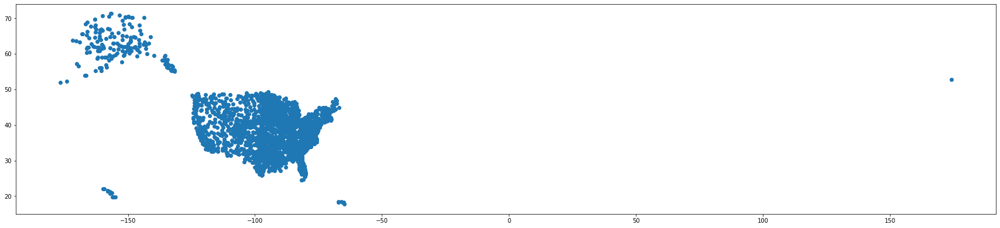

<AxesSubplot:>

In [0]:
# set CRS
print(gdf_unq_stations.crs)
gdf_unq_stations.crs = "epsg:4326"
fig, ax = plt.subplots(figsize=(30,30))
gdf_unq_stations.plot(ax=ax)

# gdf_unq_stations_0 = gdf_unq_stations.to_crs( "epsg:26910")
# gdf_unq_stations_0.plot()

In [0]:
folium.GeoJson?

In [0]:
map1 = folium.Map(location=[37.8721, -122.2578],   # lat, lon around which to center the map
                 tiles= "OpenStreetMap",
                 width="100%",                     # the width & height of the output map
                 height=300,                       # in pixels (int) or in percent of available space (str)
                 zoom_start=2)                    # the zoom level for the data to be displayed (3-20)

folium.GeoJson(gdf_airport).add_to(map1)
map1

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3010530795774054> in <module> 
 5 zoom_start=2) # the zoom level for the data to be displayed (3-20)
 6 
 ----> 7 folium . GeoJson ( gdf_airport ) . add_to ( map1 ) 
 8 map1

 NameError : name 'gdf_airport' is not defined

# APPENDIX: Databricks Basics

### Import as SQL

In [0]:
%sql
SELECT * 
FROM default.globalairportdatabase_1_txt 

ICAO,IATA,AIRPORT,CITY/TOWN,COUNTRY,LAT_DEG,LAT_MIN,LAT_SEC,LAT_DIR,LONG_DEG,LONG_MIN,LONG_SEC,LONG_DIR,ALTITUDE,LAT_DEC_DEG,LONG_DEC_DEG
AYGA,GKA,GOROKA,GOROKA,PAPUA NEW GUINEA,006,004,054,S,145,023,030,E,01610,-6.082,145.392
AYLA,LAE,N/A,LAE,PAPUA NEW GUINEA,000,000,000,U,000,000,000,U,00000,0.000,0.000
AYMD,MAG,MADANG,MADANG,PAPUA NEW GUINEA,005,012,025,S,145,047,019,E,00007,-5.207,145.789
AYMH,HGU,MOUNT HAGEN,MOUNT HAGEN,PAPUA NEW GUINEA,005,049,034,S,144,017,046,E,01643,-5.826,144.296
AYNZ,LAE,NADZAB,NADZAB,PAPUA NEW GUINEA,006,034,011,S,146,043,034,E,00073,-6.570,146.726
AYPY,POM,PORT MORESBY JACKSONS INTERNATIONAL,PORT MORESBY,PAPUA NEW GUINEA,009,026,036,S,147,013,012,E,00045,-9.443,147.220
AYRB,RAB,N/A,RABAUL,PAPUA NEW GUINEA,000,000,000,U,000,000,000,U,00000,0.000,0.000
AYWK,WWK,WEWAK INTERNATIONAL,WEWAK,PAPUA NEW GUINEA,003,035,001,S,143,040,009,E,00006,-3.584,143.669
BGAM,N/A,N/A,ANGMAGSSALIK,GREENLAND,000,000,000,U,000,000,000,U,00000,0.000,0.000
BGAS,N/A,N/A,ANGISSOQ,GREENLAND,000,000,000,U,000,000,000,U,00000,0.000,0.000


### Import as Spark Context

- What is difference between Spark and Spark context?
- Spark session is a unified entry point of a spark application from Spark 2.0. It provides a way to interact with various spark's functionality with a lesser number of constructs. Instead of having a spark context, hive context, SQL context, now all of it is encapsulated in a Spark session.

In [0]:
sparkContext = sqlContext.sql('SELECT * FROM default.globalairportdatabase_1_txt')
sparkContext.show()

--------------------------------------------------------------------------- 
 AnalysisException Traceback (most recent call last)
 <command-3010530795770754> in <module> 
 ----> 1 sparkContext = sqlContext . sql ( 'SELECT * FROM default.globalairportdatabase_1_txt' ) 
 2 sparkContext . show ( ) 

 /databricks/spark/python/pyspark/sql/context.py in sql (self, sqlQuery) 
 448 [ Row ( f1 = 1 , f2 = 'row1' ) , Row ( f1 = 2 , f2 = 'row2' ) , Row ( f1 = 3 , f2 = 'row3' ) ] 
 449 """
 --> 450 return self . sparkSession . sql ( sqlQuery ) 
 451 
 452 def table ( self , tableName ) : 

 /databricks/spark/python/pyspark/sql/session.py in sql (self, sqlQuery) 
 775 [ Row ( f1 = 1 , f2 = 'row1' ) , Row ( f1 = 2 , f2 = 'row2' ) , Row ( f1 = 3 , f2 = 'row3' ) ] 
 776 """
 --> 777 return DataFrame ( self . _jsparkSession . sql ( sqlQuery ) , self . _wrapped ) 
 778 
 779 def table ( self , tableName ) : 

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py in __call__ (self, *args) 
 1302 
 1303 answer = self . gateway_client . send_command ( command ) 
 -> 1304 return_value = get_return_value(
 1305 answer, self.gateway_client, self.target_id, self.name)
 1306 

 /databricks/spark/python/pyspark/sql/utils.py in deco (*a, **kw) 
 121 # Hide where the exception came from that shows a non-Pythonic 
 122 # JVM exception message. 
 --> 123 raise converted from None 
 124 else : 
 125 raise 

 AnalysisException : Table or view not found: default.globalairportdatabase_1_txt; line 1 pos 14;
'Project [*]
+- 'UnresolvedRelation [default, globalairportdatabase_1_txt], [], false

### Display helps us figure out the distribution of the dataset

In [0]:
display(sparkContext)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3010530795771433> in <module> 
 ----> 1 display ( sparkContext ) 

 NameError : name 'sparkContext' is not defined

In [0]:
sparkdf = spark.sql("SELECT * FROM globalairportdatabase_1_txt")
sparkdf.show()

--------------------------------------------------------------------------- 
 AnalysisException Traceback (most recent call last)
 <command-3010530795771407> in <module> 
 ----> 1 sparkdf = spark . sql ( "SELECT * FROM globalairportdatabase_1_txt" ) 
 2 sparkdf . show ( ) 

 /databricks/spark/python/pyspark/sql/session.py in sql (self, sqlQuery) 
 775 [ Row ( f1 = 1 , f2 = 'row1' ) , Row ( f1 = 2 , f2 = 'row2' ) , Row ( f1 = 3 , f2 = 'row3' ) ] 
 776 """
 --> 777 return DataFrame ( self . _jsparkSession . sql ( sqlQuery ) , self . _wrapped ) 
 778 
 779 def table ( self , tableName ) : 

 /databricks/spark/python/lib/py4j-0.10.9-src.zip/py4j/java_gateway.py in __call__ (self, *args) 
 1302 
 1303 answer = self . gateway_client . send_command ( command ) 
 -> 1304 return_value = get_return_value(
 1305 answer, self.gateway_client, self.target_id, self.name)
 1306 

 /databricks/spark/python/pyspark/sql/utils.py in deco (*a, **kw) 
 121 # Hide where the exception came from that shows a non-Pythonic 
 122 # JVM exception message. 
 --> 123 raise converted from None 
 124 else : 
 125 raise 

 AnalysisException : Table or view not found: globalairportdatabase_1_txt; line 1 pos 14;
'Project [*]
+- 'UnresolvedRelation [globalairportdatabase_1_txt], [], false

### Spark DF to Pandas

In [0]:
pandasDF = result_df.toPandas()
pandasDF

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3010530795770766> in <module> 
 ----> 1 pandasDF = result_df . toPandas ( ) 
 2 pandasDF

 NameError : name 'result_df' is not defined

### SQL to Pandas df

In [0]:
# This doesn't work
import pandas as pd
pandasDF = pd.read_sql('SELECT * FROM default.globalairportdatabase_1_txt')

--------------------------------------------------------------------------- 
 TypeError Traceback (most recent call last)
 <command-3010530795771415> in <module> 
 1 # This doesn't work 
 2 import pandas as pd
 ----> 3 pandasDF = pd . read_sql ( 'SELECT * FROM default.globalairportdatabase_1_txt' ) 

 TypeError : read_sql() missing 1 required positional argument: 'con'

In [0]:
#Haven't try it but this might help
#https://www.analyticsvidhya.com/blog/2021/07/pandasql-best-way-to-run-sql-queries-and-codes-in-jupyter-notebook-using-python/
!pip install -U pandasql

Collecting pandasql
 Downloading pandasql-0.7.3.tar.gz (26 kB)
Requirement already satisfied: numpy in /databricks/python3/lib/python3.8/site-packages (from pandasql) (1.19.2)
Requirement already satisfied: pandas in /databricks/python3/lib/python3.8/site-packages (from pandasql) (1.2.4)
Collecting sqlalchemy
 Downloading SQLAlchemy-1.4.32-cp38-cp38-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (1.6 MB)
▏ | 10 kB 31.5 MB/s eta 0:00:01 |▍ | 20 kB 37.8 MB/s eta 0:00:01 |▋ | 30 kB 39.5 MB/s eta 0:00:01 |▉ | 40 kB 24.3 MB/s eta 0:00:01 |█ | 51 kB 14.2 MB/s eta 0:00:01 |█▎ | 61 kB 16.6 MB/s eta 0:00:01 |█▍ | 71 kB 13.9 MB/s eta 0:00:01 |█▋ | 81 kB 13.6 MB/s eta 0:00:01 |█▉ | 92 kB 15.1 MB/s eta 0:00:01 |██ | 102 kB 16.5 MB/s eta 0:00:01 |██▎ | 112 kB 16.5 MB/s eta 0:00:01 |██▌ | 122 kB 16.5 MB/s eta 0:00:01 |██▋ | 133 kB 16.5 MB/s eta 0:00:01 |██▉ | 143 kB 16.5 MB/s eta 0:00:01 |███ | 153 kB 16.5 MB/s eta 0:00:01 |███▎ | 163 kB 16.5 MB/s eta 0:00:01 |███▌ | 174 kB 16.5 MB/s eta 0:00:01 |███▊ | 184 kB 16.5 MB/s eta 0:00:01 |███▉ | 194 kB 16.5 MB/s eta 0:00:01 |████ | 204 kB 16.5 MB/s eta 0:00:01 |████▎ | 215 kB 16.5 MB/s eta 0:00:01 |████▌ | 225 kB 16.5 MB/s eta 0:00:01 |████▊ | 235 kB 16.5 MB/s eta 0:00:01 |█████ | 245 kB 16.5 MB/s eta 0:00:01 |█████ | 256 kB 16.5 MB/s eta 0:00:01 |█████▎ | 266 kB 16.5 MB/s eta 0:00:01 |█████▌ | 276 kB 16.5 MB/s eta 0:00:01 |█████▊ | 286 kB 16.5 MB/s eta 0:00:01 |██████ | 296 kB 16.5 MB/s eta 0:00:01 |██████▏ | 307 kB 16.5 MB/s eta 0:00:01 |██████▍ | 317 kB 16.5 MB/s eta 0:00:01 |██████▌ | 327 kB 16.5 MB/s eta 0:00:01 |██████▊ | 337 kB 16.5 MB/s eta 0:00:01 |███████ | 348 kB 16.5 MB/s eta 0:00:01 |███████▏ | 358 kB 16.5 MB/s eta 0:00:01 |███████▍ | 368 kB 16.5 MB/s eta 0:00:01 |███████▋ | 378 kB 16.5 MB/s eta 0:00:01 |███████▊ | 389 kB 16.5 MB/s eta 0:00:01 |████████ | 399 kB 16.5 MB/s eta 0:00:01 |████████▏ | 409 kB 16.5 MB/s eta 0:00:01 |████████▍ | 419 kB 16.5 MB/s eta 0:00:01 |████████▋ | 430 kB 16.5 MB/s eta 0:00:01 |████████▉ | 440 kB 16.5 MB/s eta 0:00:01 |█████████ | 450 kB 16.5 MB/s eta 0:00:01 |█████████▏ | 460 kB 16.5 MB/s eta 0:00:01 |█████████▍ | 471 kB 16.5 MB/s eta 0:00:01 |█████████▋ | 481 kB 16.5 MB/s eta 0:00:01 |█████████▉ | 491 kB 16.5 MB/s eta 0:00:01 |██████████ | 501 kB 16.5 MB/s eta 0:00:01 |██████████▏ | 512 kB 16.5 MB/s eta 0:00:01 |██████████▍ | 522 kB 16.5 MB/s eta 0:00:01 |██████████▋ | 532 kB 16.5 MB/s eta 0:00:01 |██████████▉ | 542 kB 16.5 MB/s eta 0:00:01 |███████████ | 552 kB 16.5 MB/s eta 0:00:01 |███████████▎ | 563 kB 16.5 MB/s eta 0:00:01 |███████████▌ | 573 kB 16.5 MB/s eta 0:00:01 |███████████▋ | 583 kB 16.5 MB/s eta 0:00:01 |███████████▉ | 593 kB 16.5 MB/s eta 0:00:01 |████████████ | 604 kB 16.5 MB/s eta 0:00:01 |████████████▎ | 614 kB 16.5 MB/s eta 0:00:01 |████████████▌ | 624 kB 16.5 MB/s eta 0:00:01 |████████████▊ | 634 kB 16.5 MB/s eta 0:00:01 |████████████▉ | 645 kB 16.5 MB/s eta 0:00:01 |█████████████ | 655 kB 16.5 MB/s eta 0:00:01 |█████████████▎ | 665 kB 16.5 MB/s eta 0:00:01 |█████████████▌ | 675 kB 16.5 MB/s eta 0:00:01 |█████████████▊ | 686 kB 16.5 MB/s eta 0:00:01 |██████████████ | 696 kB 16.5 MB/s eta 0:00:01 |██████████████ | 706 kB 16.5 MB/s eta 0:00:01 |██████████████▎ | 716 kB 16.5 MB/s eta 0:00:01 |██████████████▌ | 727 kB 16.5 MB/s eta 0:00:01 |██████████████▊ | 737 kB 16.5 MB/s eta 0:00:01 |███████████████ | 747 kB 16.5 MB/s eta 0:00:01 |███████████████▏ | 757 kB 16.5 MB/s eta 0:00:01 |███████████████▎ | 768 kB 16.5 MB/s eta 0:00:01 |███████████████▌ | 778 kB 16.5 MB/s eta 0:00:01 |███████████████▊ | 788 kB 16.5 MB/s eta 0:00:01 |████████████████ | 798 kB 16.5 MB/s eta 0:00:01 |████████████████▏ | 808 kB 16.5 MB/s eta 0:00:01 |████████████████▍ | 819 kB 16.5 MB/s eta 0:00:01 |████████████████▋ | 829 kB 16.5 MB/s eta 0:00:01 |████████████████▊ | 839 kB 16.5 MB/s eta 0:00:01 |█████████████████ | 849 kB 16.5 MB/s eta 

### Store Spark df to blob storage

In [0]:

sdf_airport_raw = spark.sql("SELECT * FROM globalairportdatabase_1_txt")
#globalairportdatabase_raw_data

sdf_airport_raw.write.parquet(f"{blob_url}/globalairportdatabase_raw_data")

In [0]:
check_if_stored = spark.read.parquet(f"{blob_url}/globalairportdatabase_raw_data")
display(check_if_stored)

ICAO,IATA,AIRPORT,CITY/TOWN,COUNTRY,LAT_DEG,LAT_MIN,LAT_SEC,LAT_DIR,LONG_DEG,LONG_MIN,LONG_SEC,LONG_DIR,ALTITUDE,LAT_DEC_DEG,LONG_DEC_DEG
AYGA,GKA,GOROKA,GOROKA,PAPUA NEW GUINEA,006,004,054,S,145,023,030,E,01610,-6.082,145.392
AYLA,LAE,N/A,LAE,PAPUA NEW GUINEA,000,000,000,U,000,000,000,U,00000,0.000,0.000
AYMD,MAG,MADANG,MADANG,PAPUA NEW GUINEA,005,012,025,S,145,047,019,E,00007,-5.207,145.789
AYMH,HGU,MOUNT HAGEN,MOUNT HAGEN,PAPUA NEW GUINEA,005,049,034,S,144,017,046,E,01643,-5.826,144.296
AYNZ,LAE,NADZAB,NADZAB,PAPUA NEW GUINEA,006,034,011,S,146,043,034,E,00073,-6.570,146.726
AYPY,POM,PORT MORESBY JACKSONS INTERNATIONAL,PORT MORESBY,PAPUA NEW GUINEA,009,026,036,S,147,013,012,E,00045,-9.443,147.220
AYRB,RAB,N/A,RABAUL,PAPUA NEW GUINEA,000,000,000,U,000,000,000,U,00000,0.000,0.000
AYWK,WWK,WEWAK INTERNATIONAL,WEWAK,PAPUA NEW GUINEA,003,035,001,S,143,040,009,E,00006,-3.584,143.669
BGAM,N/A,N/A,ANGMAGSSALIK,GREENLAND,000,000,000,U,000,000,000,U,00000,0.000,0.000
BGAS,N/A,N/A,ANGISSOQ,GREENLAND,000,000,000,U,000,000,000,U,00000,0.000,0.000
